In [1]:
##===================== Statements & Copyright ===================##
"""
AUTHOR:  Xiaolong Li, VT
CONTENT: Used for Video-text project
LOG:     add code for agg model 
"""
from __future__ import absolute_import, division, print_function
import time
import random
import numpy as np
import os
import cv2
from datetime import datetime
import platform
import logging
import tensorflow as tf
from tensorflow.contrib import slim
import sys
import collections
from copy import deepcopy

import _init_paths
from model import model
from model import model_flow_east
from pwc.dataset_base import _DEFAULT_DS_VAL_OPTIONS
from pwc.model_pwcnet import ModelPWCNet, _DEFAULT_PWCNET_VAL_OPTIONS
from pwc.net_options import cfg_lg, cfg_sm
from config.configrnn import get_config
from model.model_aggregation import Aggregation
from lstm import model_gru_agg
from utils.icdar import restore_rectangle
import lanms
from utils.eval import resize_image, sort_poly, detect
from utils.icdar import load_annotations_solo, check_and_validate_polys
from utils.nms_highlevel import intersection
import matplotlib.pyplot as plt
now = datetime.now()
logger = logging.getLogger(__name__)
logger.setLevel(logging.INFO)
# used for iou searching and selecting TP, FP, FN #
def eval_single_frame(target, box):
    """
    input params:
        target, python ordered dict
        box, sorted boxes dict from predictions
    """
    TP   = 0
    FP   = 0
    FN   = 0
    precision = 0
    recall = 0
    F_measure = 0
    if not len(box['text_lines']) == 0:
        for t in target:
            d = np.array(t, dtype='int32')
            is_best = 0
            for m in box['text_lines']:
                n = np.array([m['x0'], m['y0'], m['x1'], m['y1'], m['x2'],
                              m['y2'], m['x3'], m['y3']], dtype='int32')

                # pick out the best match
                iou = intersection(n, d)
                if iou>is_best:
                    is_best = iou
            if is_best > 0.5:
                TP = TP+1
            elif is_best == 0:
                FN = FN +1
            else:
                FP = FP+1
        if TP > 0:
            precision = TP/(TP+FP)
            recall    = TP/(TP+FN)
            F_measure = 2*precision*recall/(precision+recall)
#     if len(target) == 0:
#         precision = 1
#         recall    = 1
#         F_measure = 1
    return precision, recall, F_measure


def draw_illu(illu, rst):
    for t in rst['text_lines']:
        d = np.array([t['x0'], t['y0'], t['x1'], t['y1'], t['x2'],
                      t['y2'], t['x3'], t['y3']], dtype='int32')
        d = d.reshape(-1, 2)
        cv2.polylines(illu, [d], isClosed=True, thickness=2, color=(255, 0, 0))
    return illu


def draw_illu_gt(illu, rst, p, r, f):
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontScale = 0.3
    fontColor = (255, 255, 255)
    lineType = 1
    infos = 'Precision ' + str(p)+ ', recall ' + str(r) + ', F_measure ' + str(f)
    cv2.putText(illu, infos,
                (2, 20),
                font,
                0.5,
                (255, 0, 0),
                lineType)
    for t in rst:
        d1 = t.reshape(-1, 2).astype(np.int32)
        cv2.polylines(illu, [d1], isClosed=True, thickness=2, color=(0, 0, 0))
        # bottomLeftCornerOfText = (int(t['x0']), int(t['y0']))

    return illu


def box_generation(index, img, frame_height, frame_width, f_score, f_geometry, polys_array_list, tags_array_list, start):
    timer = collections.OrderedDict([
                        ('net', 0),
                        ('restore', 0),
                        ('nms', 0)
                                   ])
    timer['net'] = time.time() - start

    boxes, timer = detect(score_map=f_score, geo_map=f_geometry, timer=timer)
    ratio_w = 512/frame_width
    ratio_h = 512/frame_height
    if boxes is not None:
        scores = boxes[:,8].reshape(-1)
        boxes = boxes[:, :8].reshape((-1, 4, 2))
        boxes[:, :, 0] /= ratio_w
        boxes[:, :, 1] /= ratio_h

    duration = time.time() - start
    timer['overall'] = duration
    text_lines = []
    if boxes is not None:
        text_lines = []
        for box, score in zip(boxes, scores):
            box = sort_poly(box.astype(np.int32))
            if np.linalg.norm(box[0] - box[1]) < 5 or np.linalg.norm(box[3]-box[0]) < 5:
                continue
            tl = collections.OrderedDict(zip(
                ['x0', 'y0', 'x1', 'y1', 'x2', 'y2', 'x3', 'y3'],
                map(float, box.flatten())))
            tl['score'] = float(score)
            text_lines.append(tl)
    pred = {
        'text_lines': text_lines
    }
    text_polys, text_tags = polys_array_list[index], tags_array_list[index]
    text_polys, text_tags = check_and_validate_polys(text_polys, text_tags, (frame_height, frame_width))
    # out.write(new_img)
    #>>>>>>>>>>>>>>>>>>>>>>>>Evaluation>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
    targets = text_polys
    precision, recall, f1 = eval_single_frame(targets, pred)
    new_img = draw_illu(img.copy(), pred)
    new_img1 = draw_illu_gt(new_img.copy(), targets, precision, recall, f1)
    return precision, recall, f1, new_img1

In [2]:
video_set = []
test_data_path = '/work/cascades/lxiaol9/ARC/EAST/data/ICDAR2013/test/'
for root, dirs, files in os.walk(test_data_path):
    for file in files:
        if file.endswith('.mp4'):
            video_set.append(os.path.splitext(file)[0])
print(video_set)

['Video_39_2_3', 'Video_48_6_4', 'Video_5_3_2', 'Video_17_3_1', 'Video_35_2_3', 'Video_6_3_2', 'Video_11_4_1', 'Video_20_5_1', 'Video_49_6_4', 'Video_23_5_2', 'Video_44_6_4', 'Video_32_2_3', 'Video_53_7_4', 'Video_24_5_2', 'Video_1_1_2']


In [3]:
############################# 1. Glabol Variables #########################################
################### 1.1 Training Setup
ICDAR2013 = '/media/dragonx/DataLight/ICDAR2013/'
ARC = '/media/dragonx/DataStorage/ARC/'
############ Macros ############
BASIC = "basic"
CUDNN = "cudnn"
BLOCK = "block"
CONV  = "conv2d"
CUDNN_INPUT_LINEAR_MODE = "linear_input"
CUDNN_RNN_BIDIRECTION   = "bidirection"
CUDNN_RNN_UNIDIRECTION = "unidirection"
if platform.uname()[1] != 'dragonx-H97N-WIFI':
    print("Now it knows it's in a remote cluster")
    ARC = '/work/cascades/lxiaol9/ARC/'
    ICDAR2013 = '/work/cascades/lxiaol9/ARC/EAST/data/ICDAR2013/'

tf.app.flags.DEFINE_string('mode', 'test', 'whether debugging or real running')
tf.app.flags.DEFINE_string("model", "test", "A type of model. Possible options are: small, medium, large.")
tf.app.flags.DEFINE_integer('input_size', 512, '')
tf.app.flags.DEFINE_integer('batch_size_per_gpu', 8, '')
tf.app.flags.DEFINE_integer('seq_len', 5, '')
tf.app.flags.DEFINE_integer('num_steps', 5, '')
tf.app.flags.DEFINE_string('gpu_list', '0,1', '')
tf.app.flags.DEFINE_float('moving_average_decay', 0.9997, '')
tf.app.flags.DEFINE_integer('num_gpus', 2, '')

tf.app.flags.DEFINE_string('geometry', 'RBOX', 'which geometry to generate, RBOX or QUAD')
tf.app.flags.DEFINE_string('checkpoint_path', '/work/cascades/lxiaol9/ARC/EAST/checkpoints/FLOW_east/20181109-210436/model.ckpt-31902', '')
# Model 1: EAST
tf.app.flags.DEFINE_string('pretrained_model_path', ARC + "EAST/checkpoints/east/20180921-173054/model.ckpt-56092", '')
# Model 2: PWC-net
tf.app.flags.DEFINE_string('flownet_type', "large", '')
tf.app.flags.DEFINE_string("rnn_mode", CONV, "one of CUDNN: BASIC, BLOCK")
# Model 3: AGG
tf.app.flags.DEFINE_string("prev_checkpoint_path", "/work/cascades/lxiaol9/ARC/EAST/checkpoints/GRU_agg/20181202-225518/model.ckpt-3521", 'path' )

tf.app.flags.DEFINE_boolean("vis", True, '')
FLAGS = tf.app.flags.FLAGS

Now it knows it's in a remote cluster


In [4]:
save_path = '/work/cascades/lxiaol9/ARC/EAST/data/ICDAR2013/test_results_gruagg/'
if not os.path.exists(save_path):
    os.makedirs(save_path) 

resnet_v1_50/block1 (?, ?, ?, 256)
resnet_v1_50/block2 (?, ?, ?, 512)
resnet_v1_50/block3 (?, ?, ?, 1024)
resnet_v1_50/block4 (?, ?, ?, 2048)
Shape of f_0 (?, ?, ?, 2048)
Shape of f_1 (?, ?, ?, 512)
Shape of f_2 (?, ?, ?, 256)
Shape of f_3 (?, ?, ?, 64)
Shape of h_0 (?, ?, ?, 2048), g_0 (?, ?, ?, 2048)
Shape of h_1 (?, ?, ?, 128), g_1 (?, ?, ?, 128)
Shape of h_2 (?, ?, ?, 64), g_2 (?, ?, ?, 64)
Shape of h_3 (?, ?, ?, 32), g_3 (?, ?, ?, 32)
INFO:tensorflow:Restoring parameters from /work/cascades/lxiaol9/ARC/EAST/checkpoints/east/20180921-173054/model.ckpt-56092
continue training from previous checkpoint
INFO:tensorflow:Restoring parameters from /work/cascades/lxiaol9/ARC/EAST/checkpoints/GRU_agg/20181202-225518/model.ckpt-3521
Building model...
Instructions for updating:
`normal` is a deprecated alias for `truncated_normal`
... model built.
Loading model checkpoint /work/cascades/lxiaol9/ARC/PWC/checkpoints/pwcnet-lg-6-2-multisteps-chairsthingsmix/pwcnet.ckpt-595000 for eval or testing

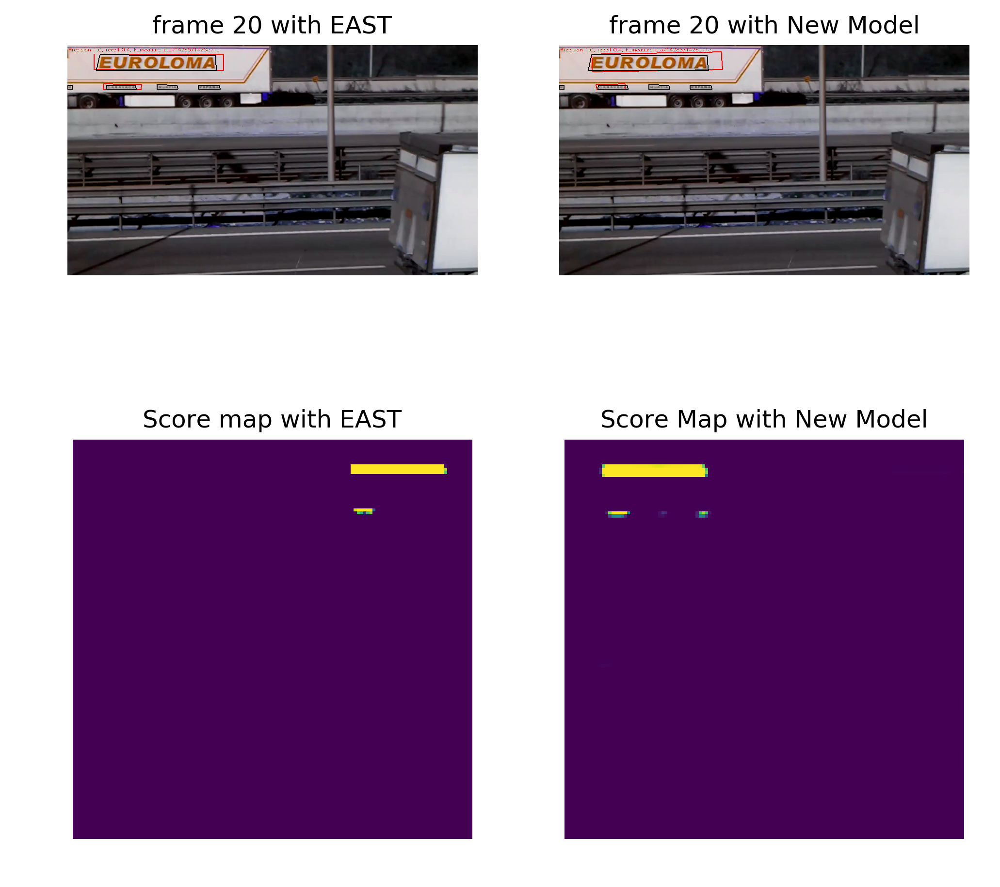

156 text boxes before nms, 4 text boxes after nms
New Model:results on frame 21 is P:0.75, R1.0, F:0.8571428571428571
146 text boxes before nms, 4 text boxes after nms
EAST Model:results on frame 21 is P:0.75, R1.0, F:0.8571428571428571
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


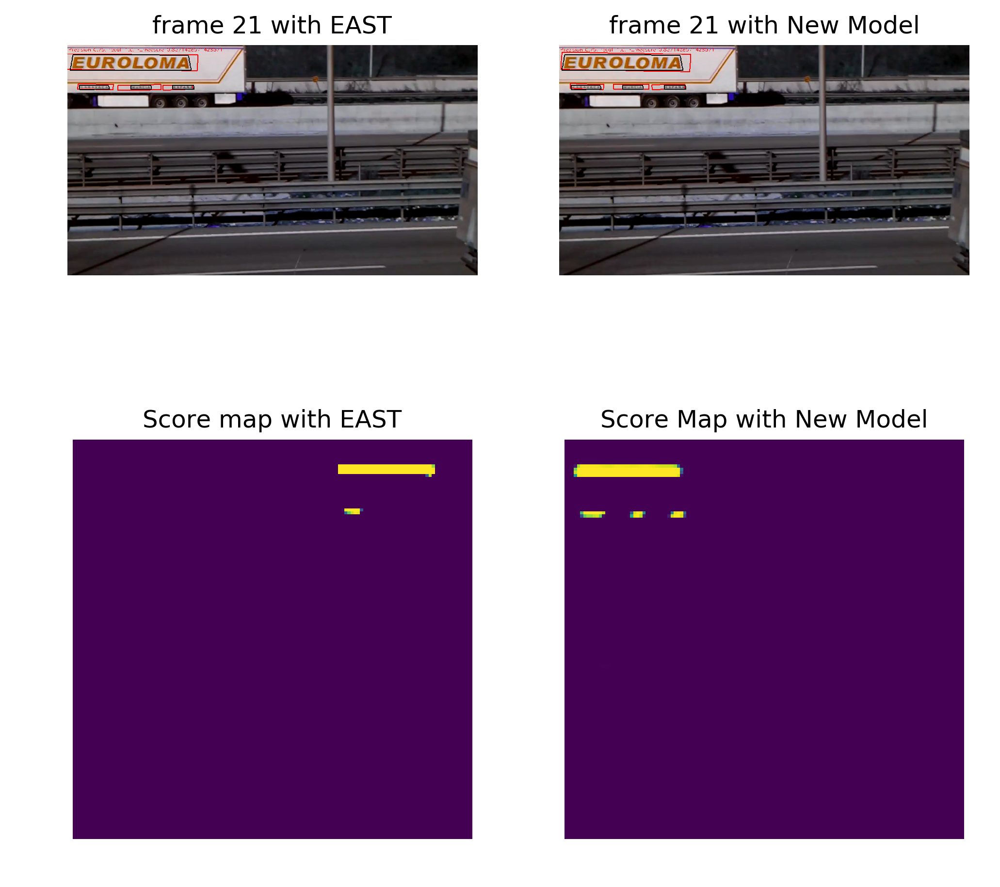

154 text boxes before nms, 4 text boxes after nms
New Model:results on frame 22 is P:0.5, R1.0, F:0.6666666666666666
146 text boxes before nms, 4 text boxes after nms
EAST Model:results on frame 22 is P:0.75, R1.0, F:0.8571428571428571
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


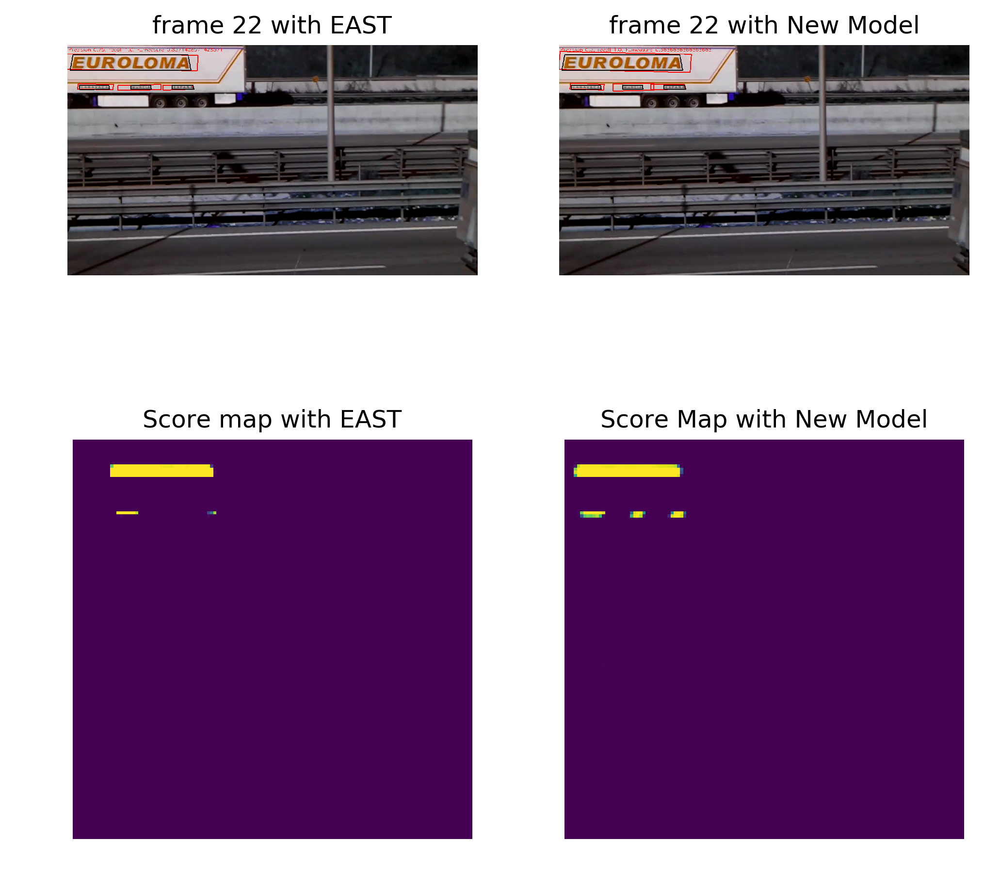

128 text boxes before nms, 3 text boxes after nms
New Model:results on frame 23 is P:0.6666666666666666, R0.6666666666666666, F:0.6666666666666666
110 text boxes before nms, 2 text boxes after nms
EAST Model:results on frame 23 is P:0.5, R0.3333333333333333, F:0.4
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


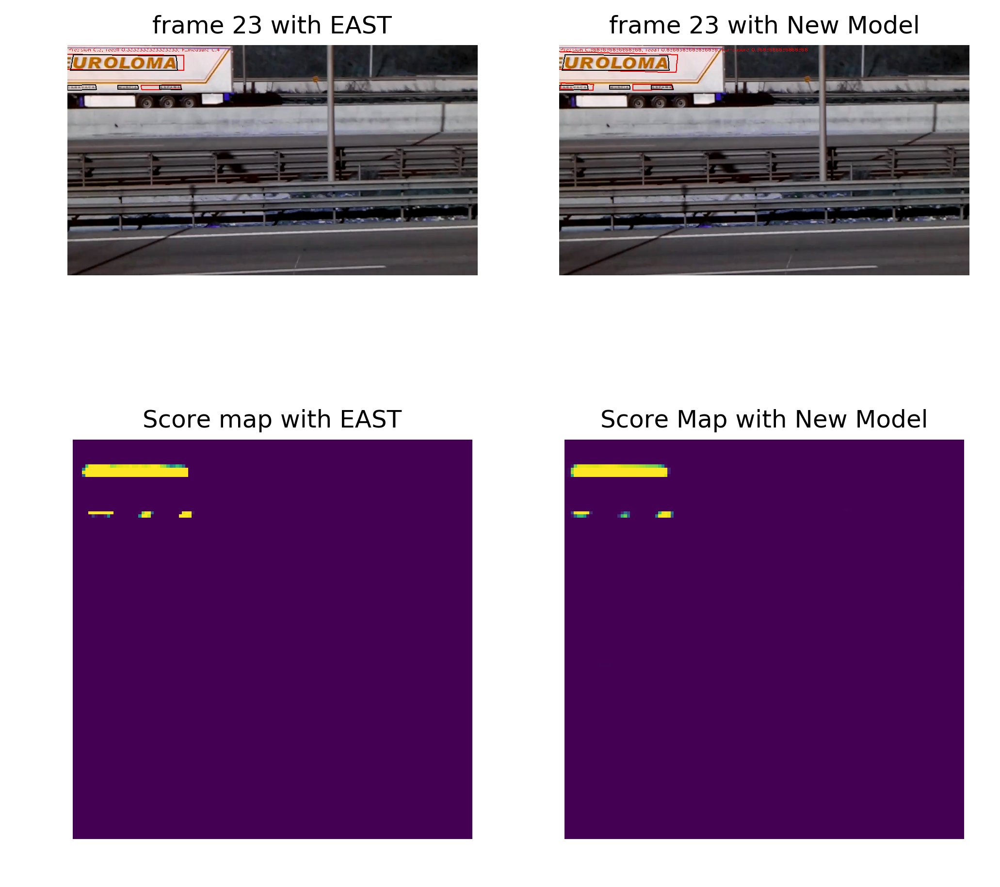

104 text boxes before nms, 2 text boxes after nms
New Model:results on frame 24 is P:0.5, R0.3333333333333333, F:0.4
98 text boxes before nms, 2 text boxes after nms
EAST Model:results on frame 24 is P:1.0, R0.5, F:0.6666666666666666
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


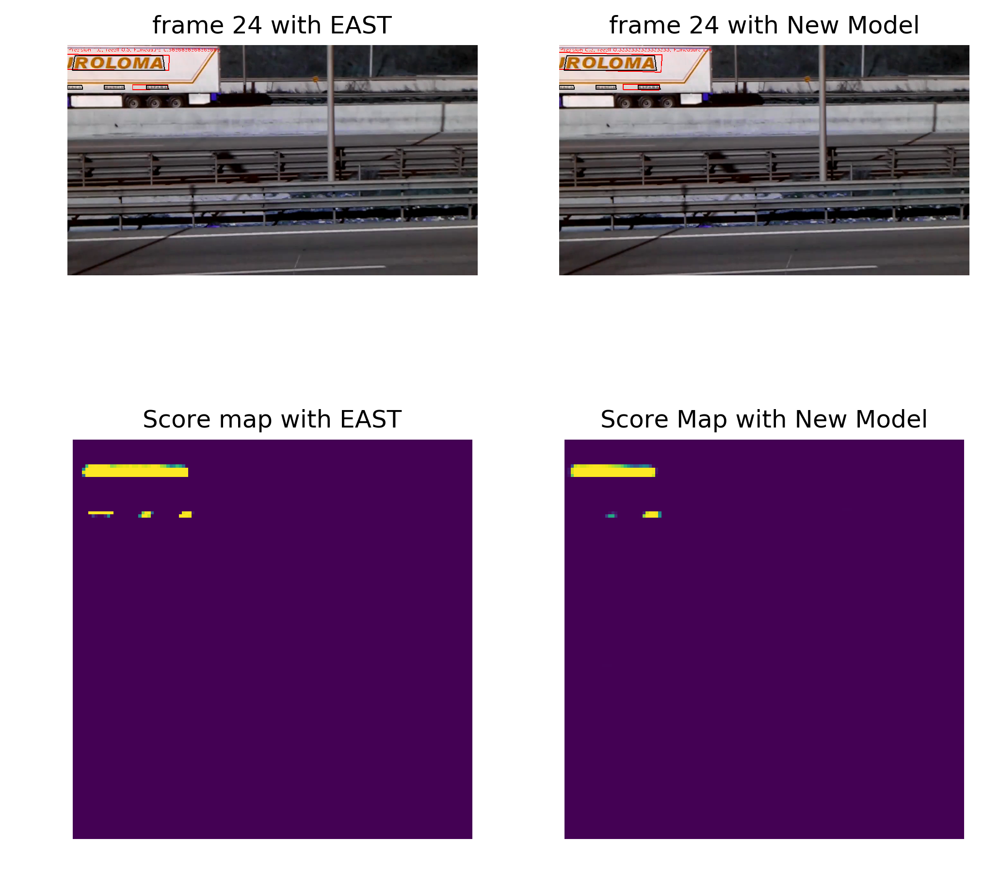

91 text boxes before nms, 2 text boxes after nms
New Model:results on frame 25 is P:0.5, R0.5, F:0.5
85 text boxes before nms, 2 text boxes after nms
EAST Model:results on frame 25 is P:1.0, R0.6666666666666666, F:0.8
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


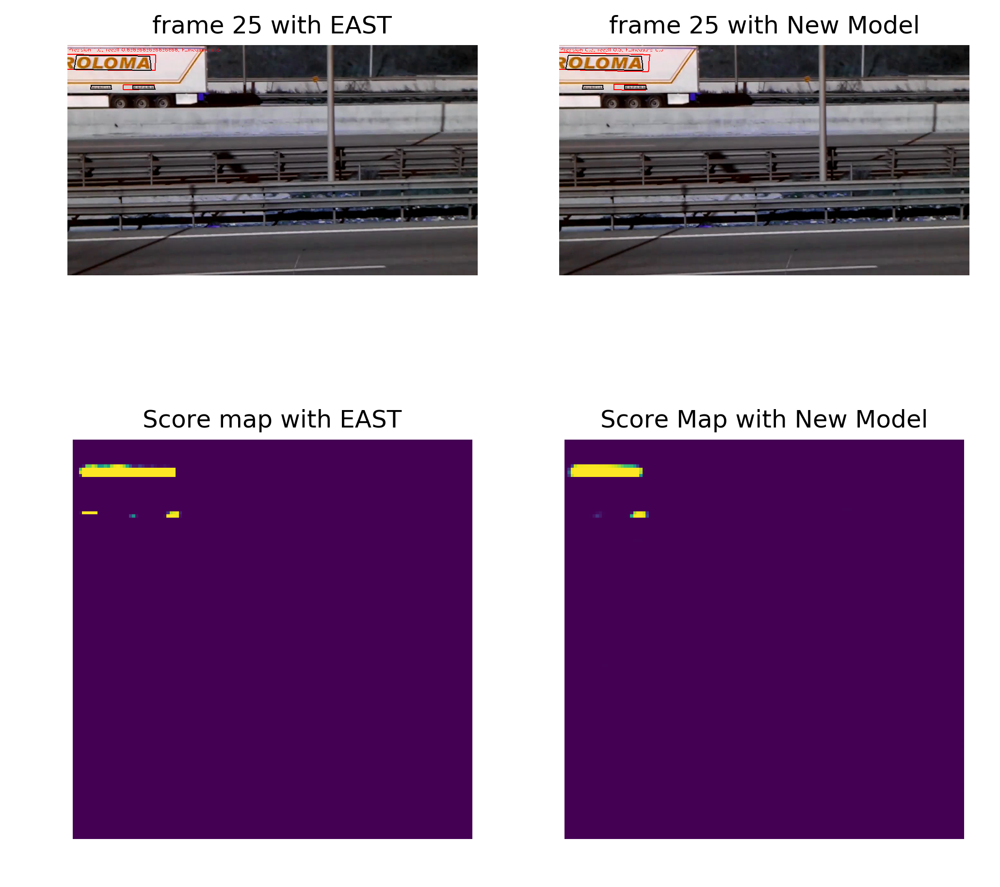

72 text boxes before nms, 2 text boxes after nms
New Model:results on frame 26 is P:1.0, R0.6666666666666666, F:0.8
69 text boxes before nms, 2 text boxes after nms
EAST Model:results on frame 26 is P:1.0, R0.6666666666666666, F:0.8
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


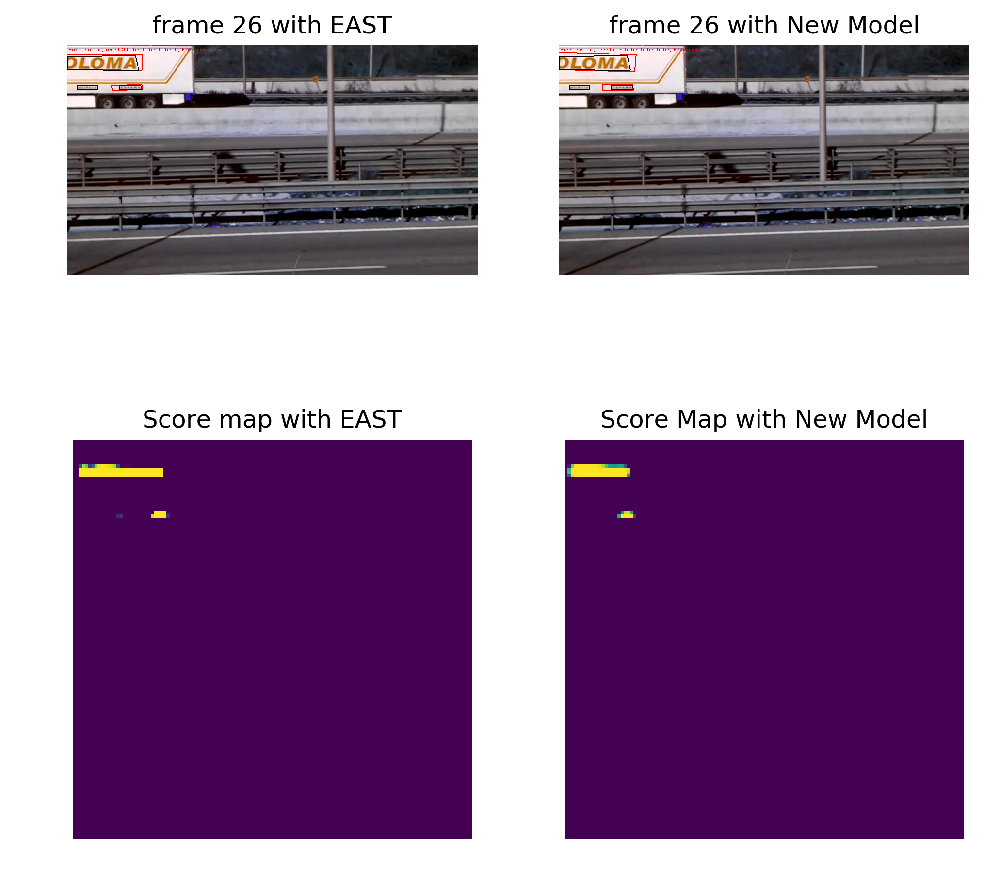

52 text boxes before nms, 2 text boxes after nms
New Model:results on frame 27 is P:1.0, R0.6666666666666666, F:0.8
48 text boxes before nms, 2 text boxes after nms
EAST Model:results on frame 27 is P:1.0, R0.6666666666666666, F:0.8
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


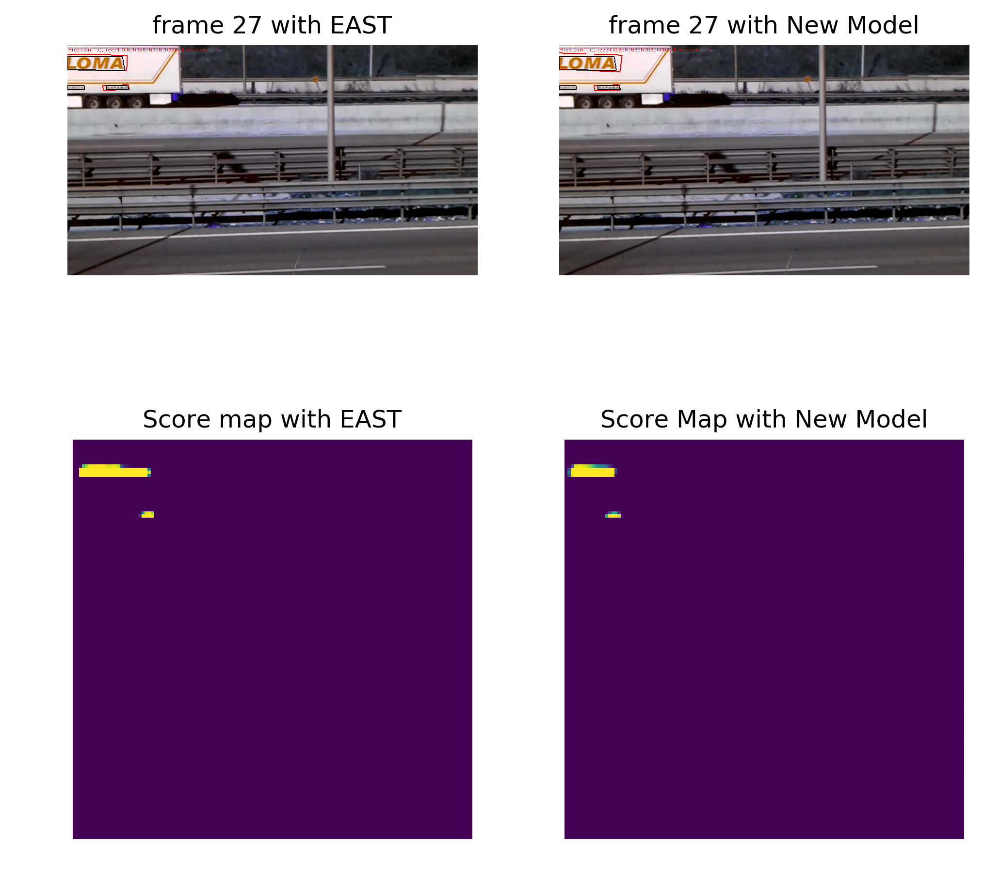

27 text boxes before nms, 2 text boxes after nms
New Model:results on frame 28 is P:1.0, R1.0, F:1.0
26 text boxes before nms, 2 text boxes after nms
EAST Model:results on frame 28 is P:1.0, R1.0, F:1.0
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


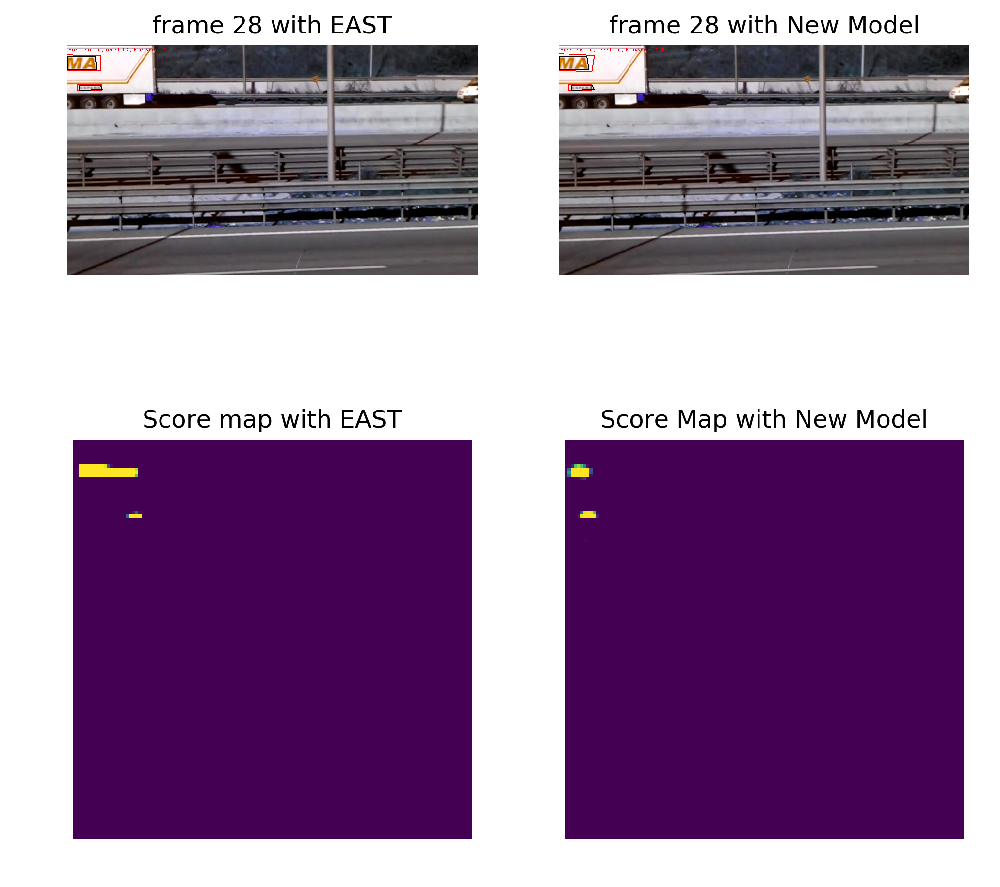

27 text boxes before nms, 2 text boxes after nms
New Model:results on frame 29 is P:1.0, R1.0, F:1.0
26 text boxes before nms, 2 text boxes after nms
EAST Model:results on frame 29 is P:1.0, R1.0, F:1.0
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


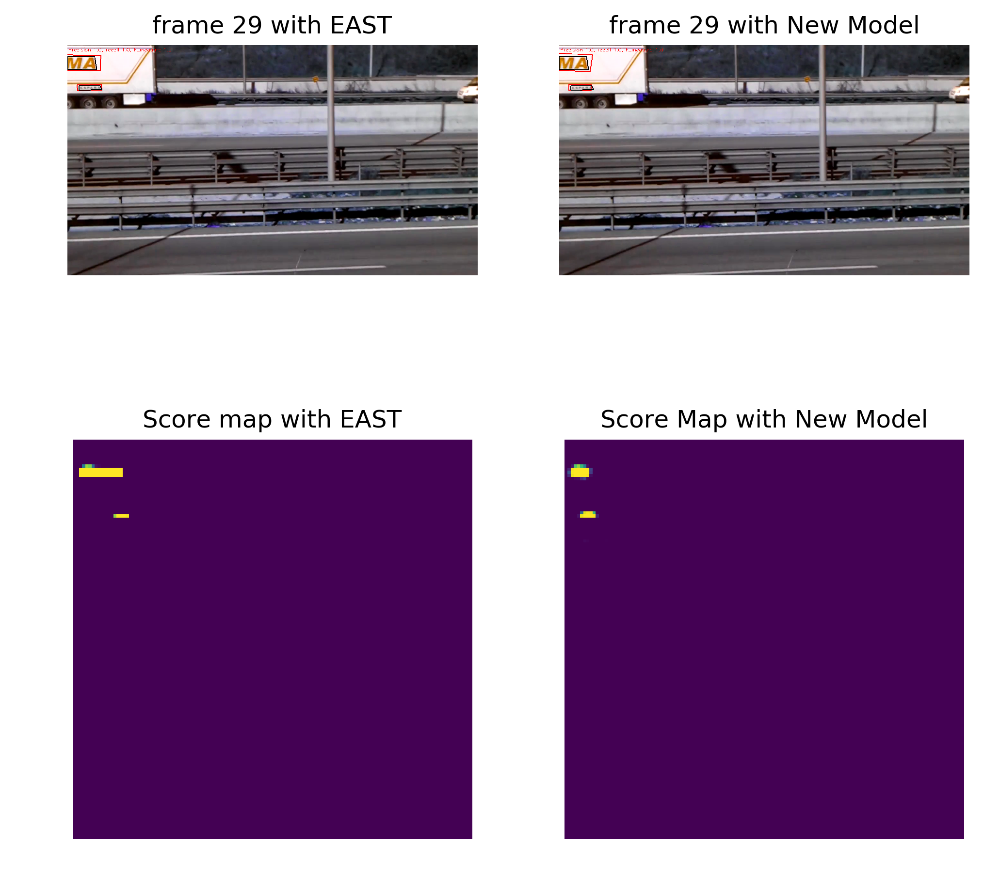

New Model:results on frame 30 is P:0, R0, F:0
EAST Model:results on frame 30 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


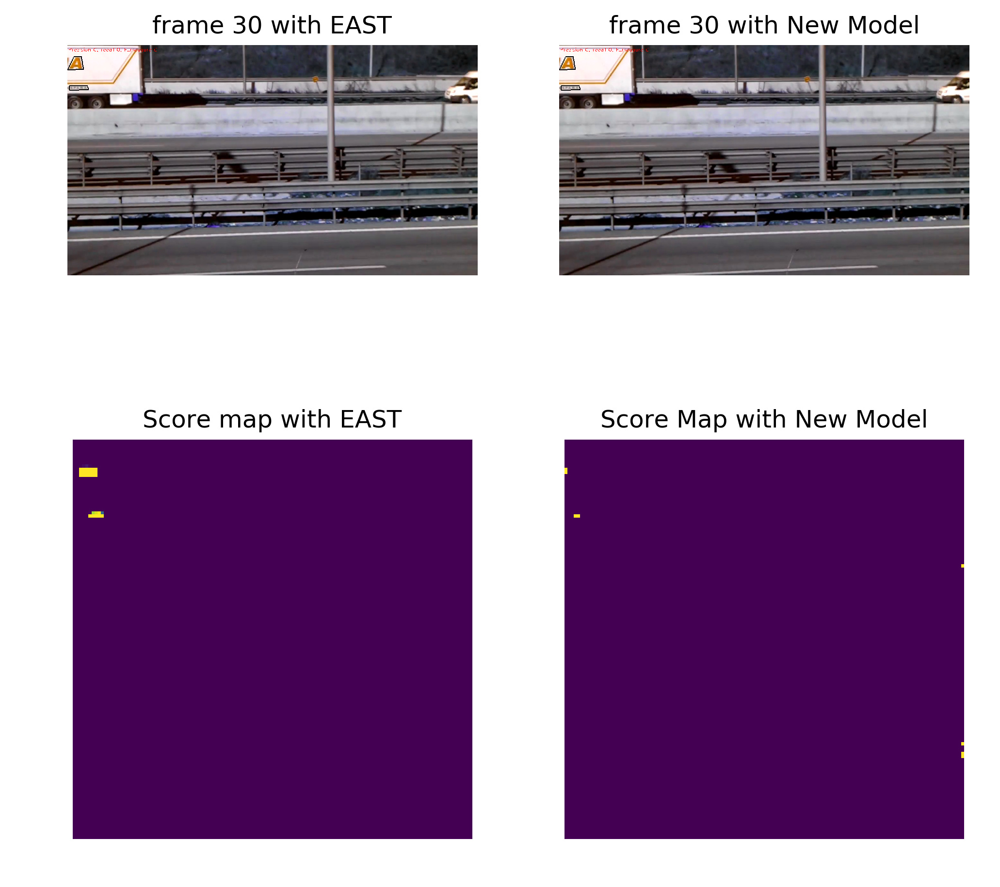

New Model:results on frame 31 is P:0, R0, F:0
EAST Model:results on frame 31 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


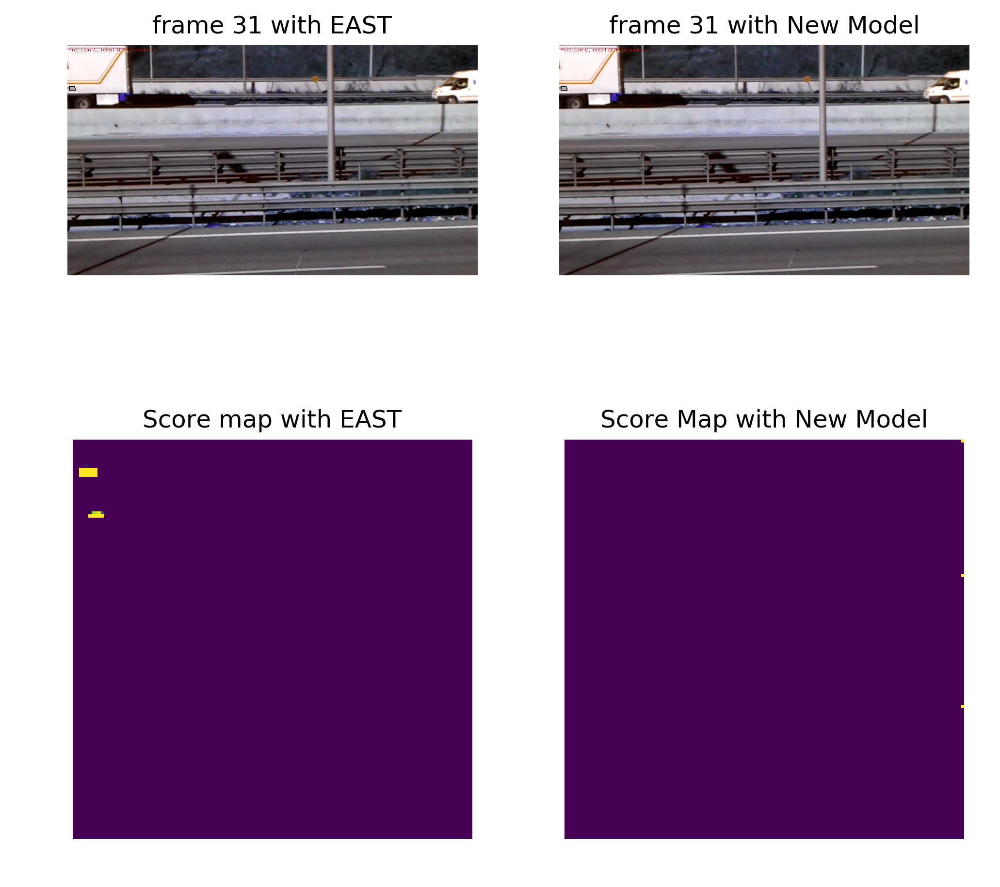

New Model:results on frame 32 is P:0, R0, F:0
EAST Model:results on frame 32 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


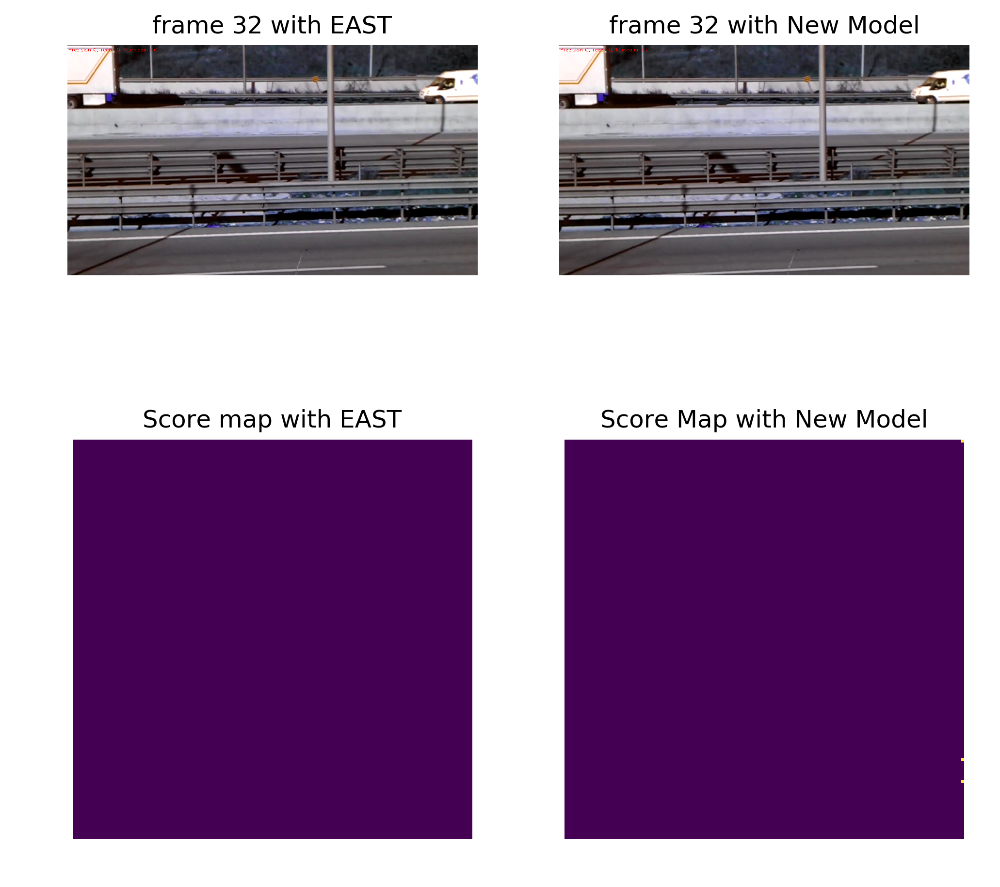

New Model:results on frame 33 is P:0, R0, F:0
EAST Model:results on frame 33 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


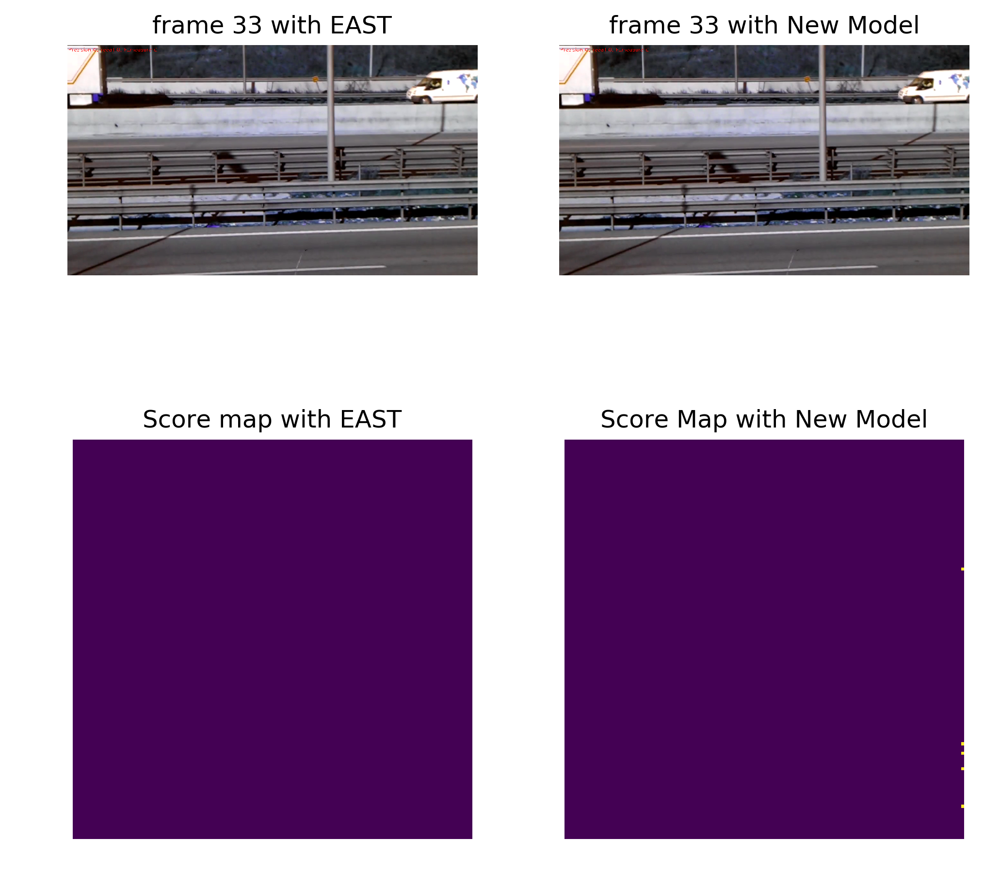

New Model:results on frame 34 is P:0, R0, F:0
EAST Model:results on frame 34 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


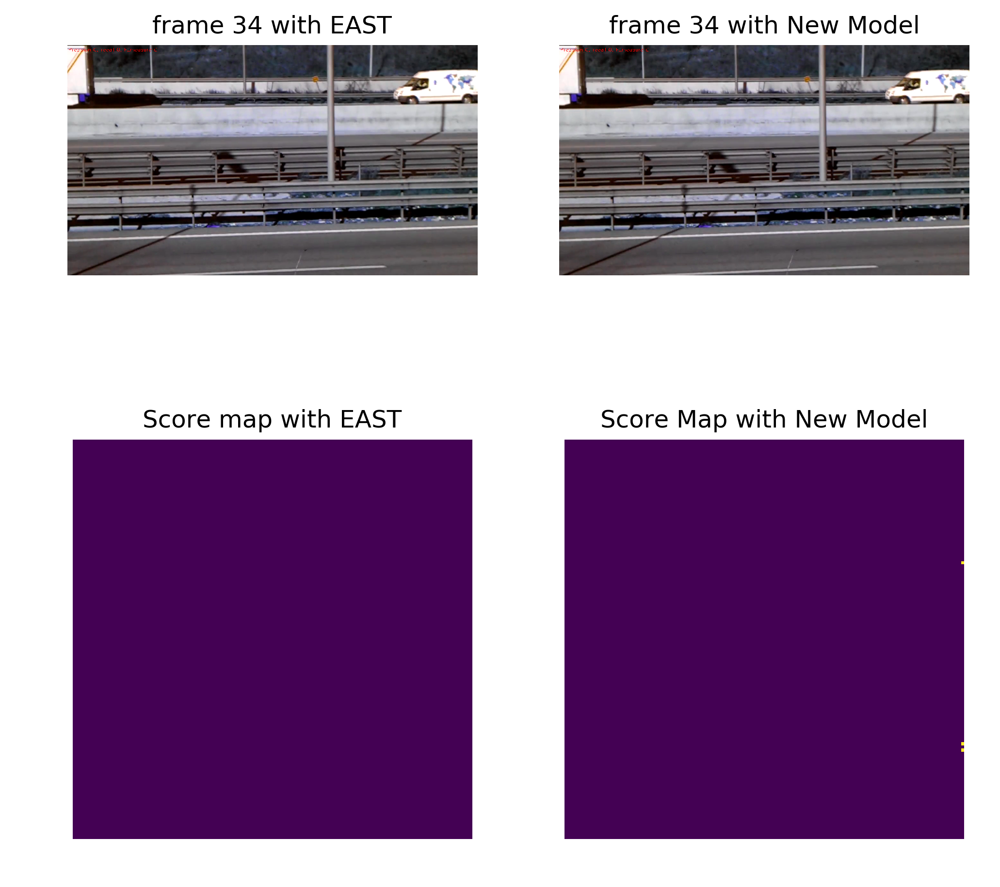

New Model:results on frame 35 is P:0, R0, F:0
EAST Model:results on frame 35 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


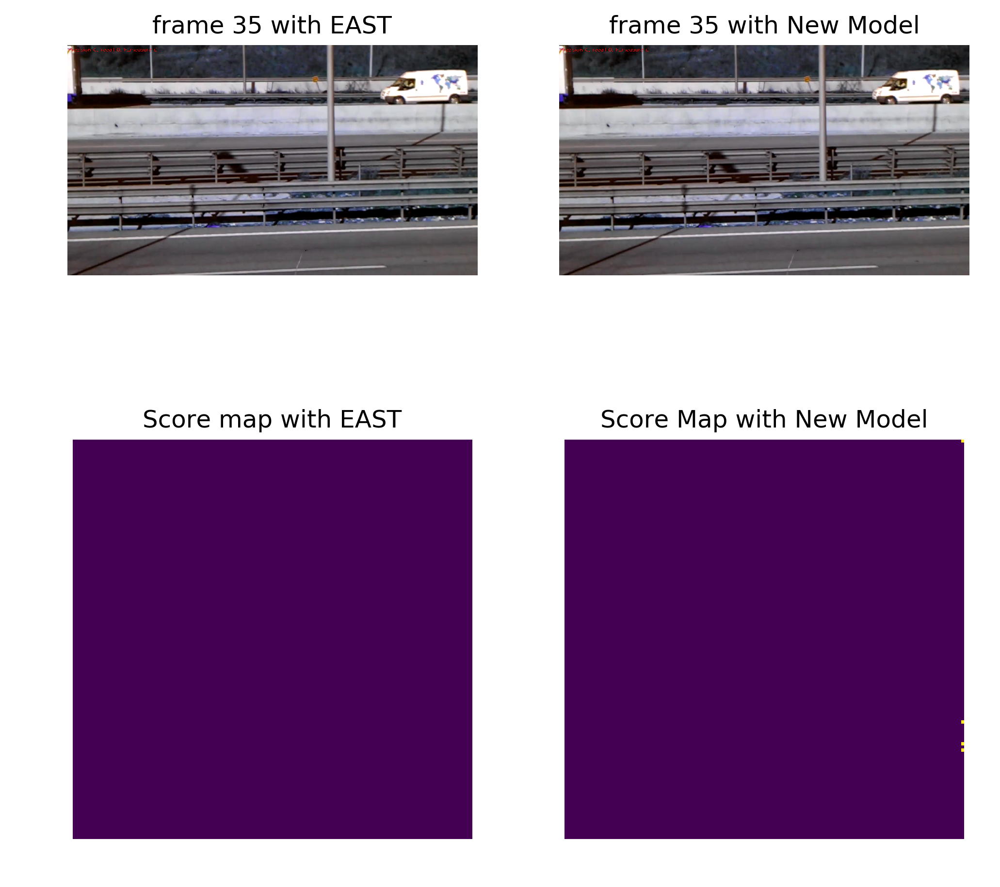

New Model:results on frame 36 is P:0, R0, F:0
EAST Model:results on frame 36 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


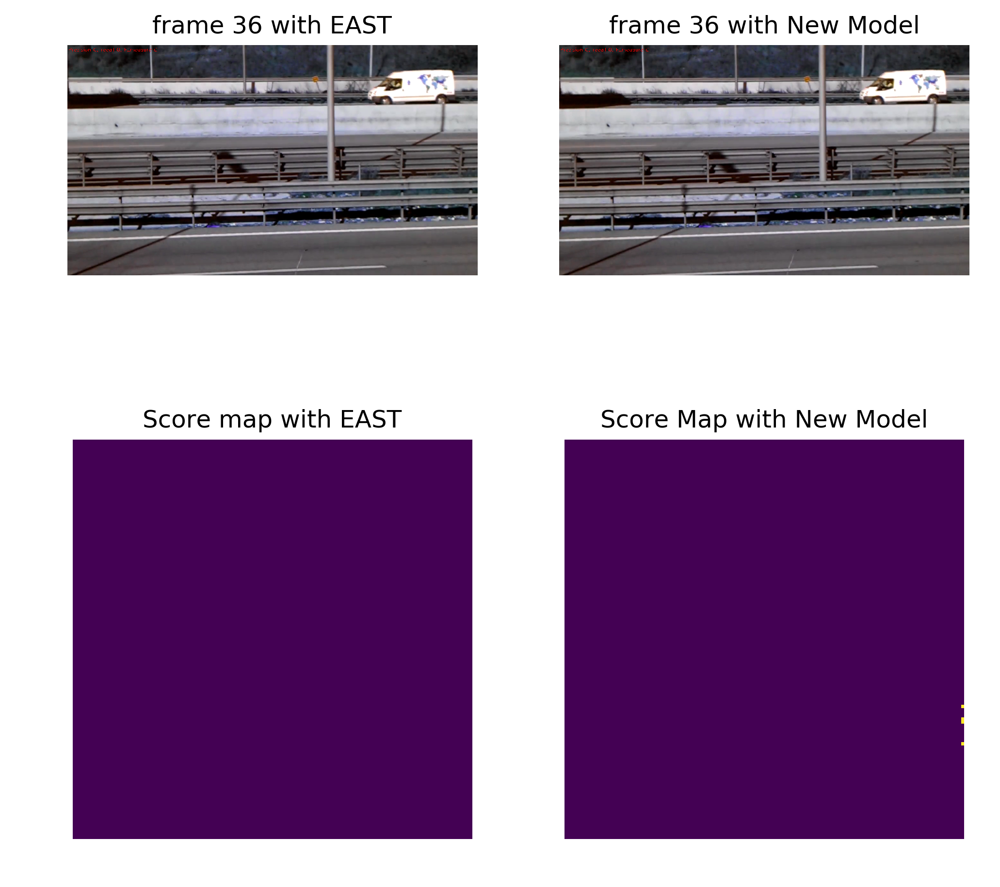

New Model:results on frame 37 is P:0, R0, F:0
EAST Model:results on frame 37 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


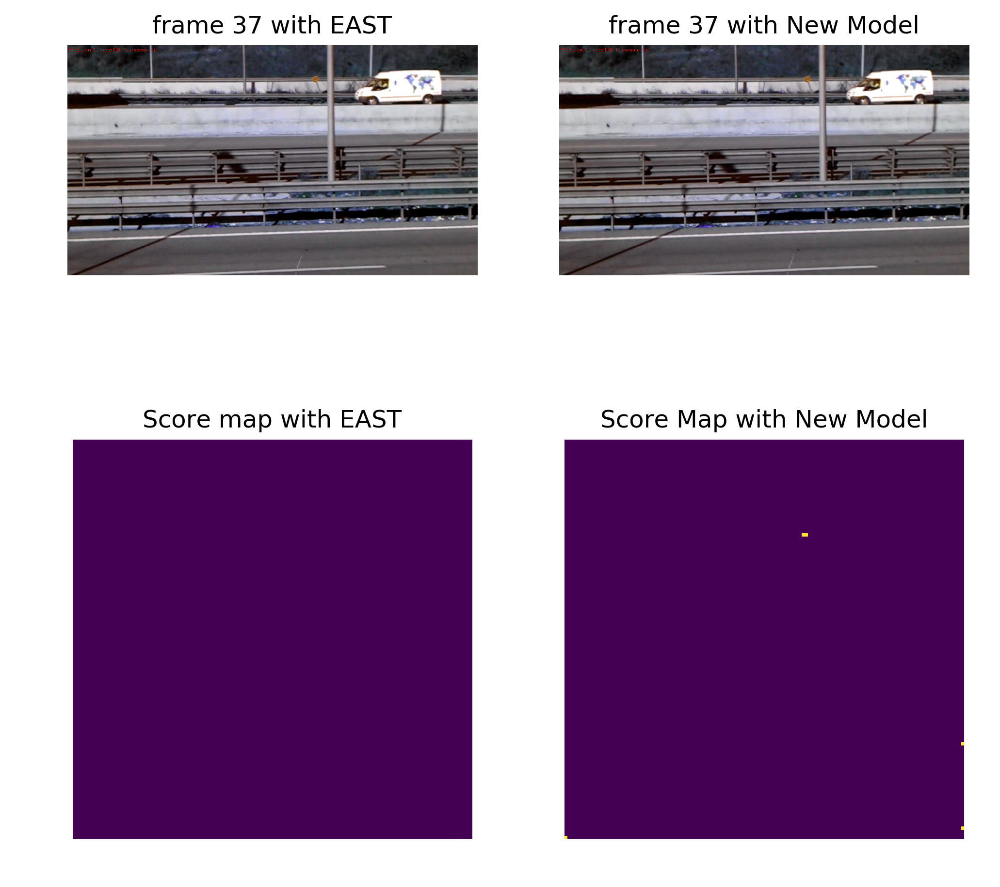

New Model:results on frame 38 is P:0, R0, F:0
EAST Model:results on frame 38 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


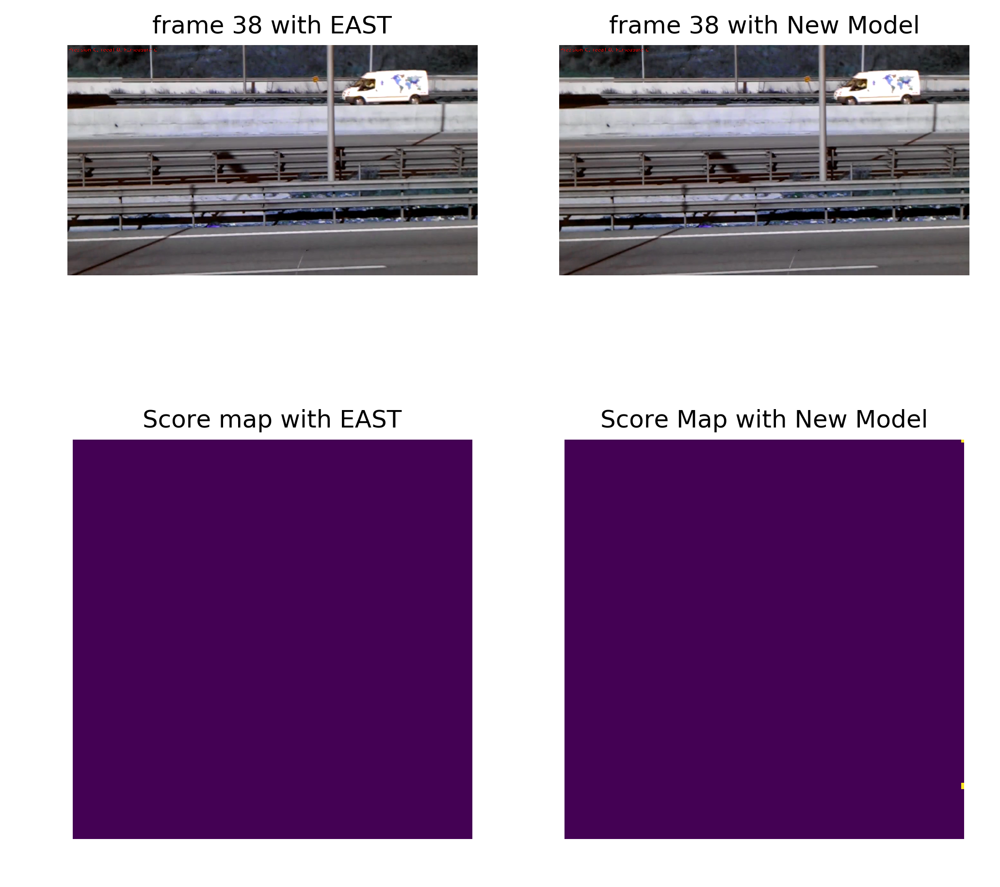

New Model:results on frame 39 is P:0, R0, F:0
EAST Model:results on frame 39 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


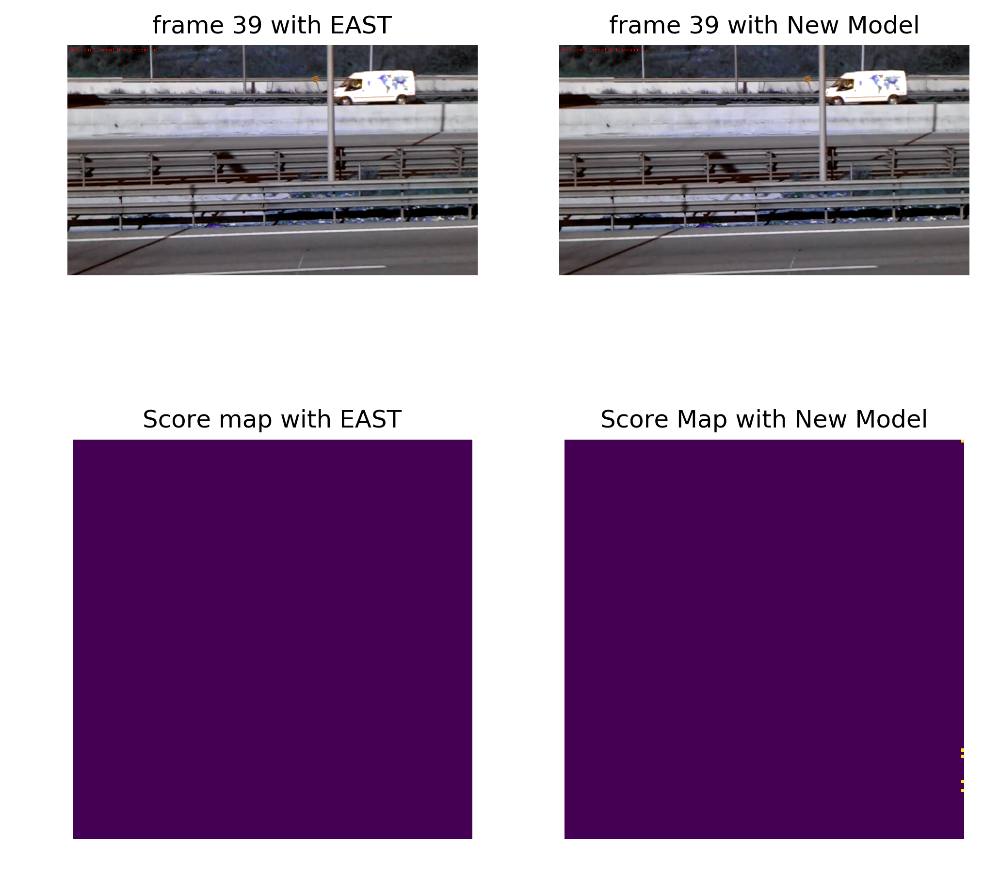

New Model:results on frame 40 is P:0, R0, F:0
EAST Model:results on frame 40 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


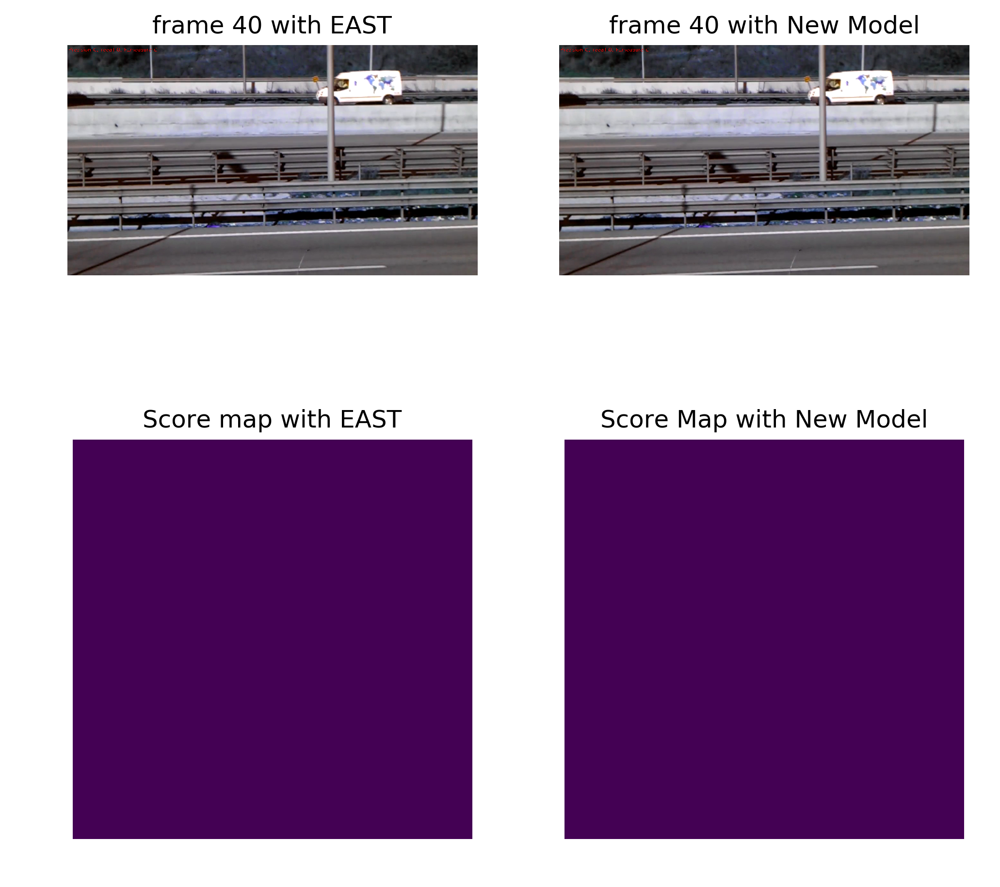

New Model:results on frame 41 is P:0, R0, F:0
EAST Model:results on frame 41 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


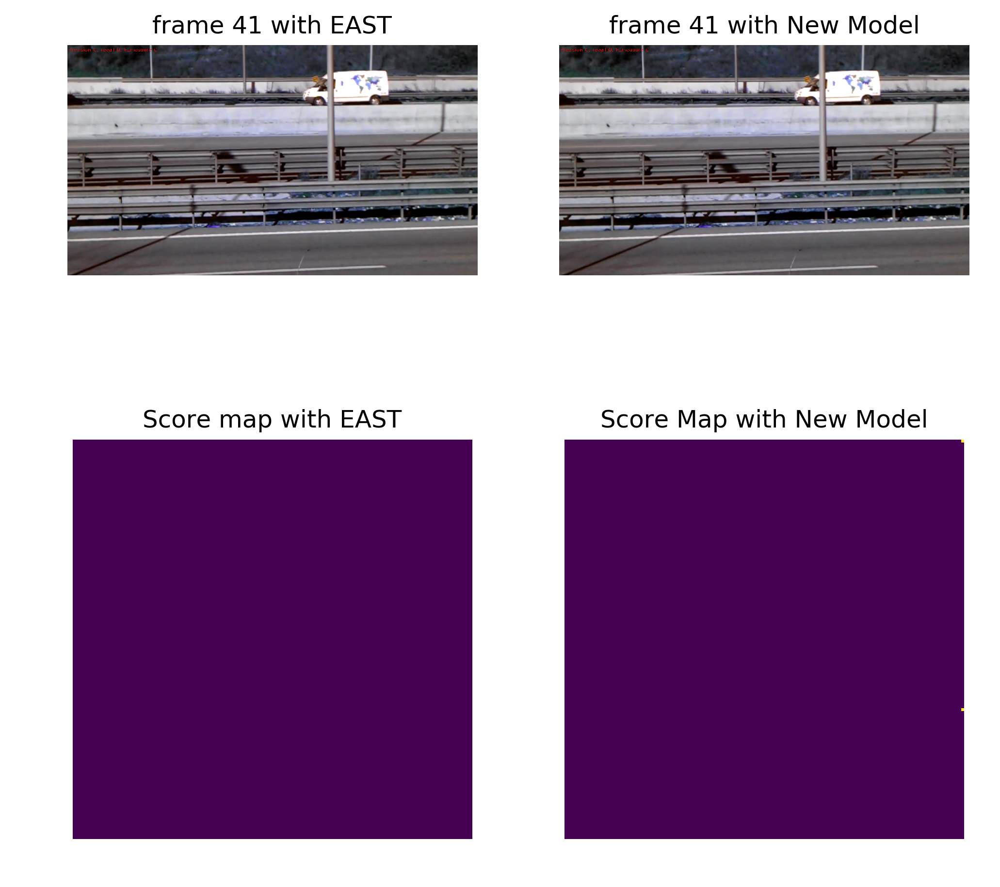

New Model:results on frame 42 is P:0, R0, F:0
EAST Model:results on frame 42 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


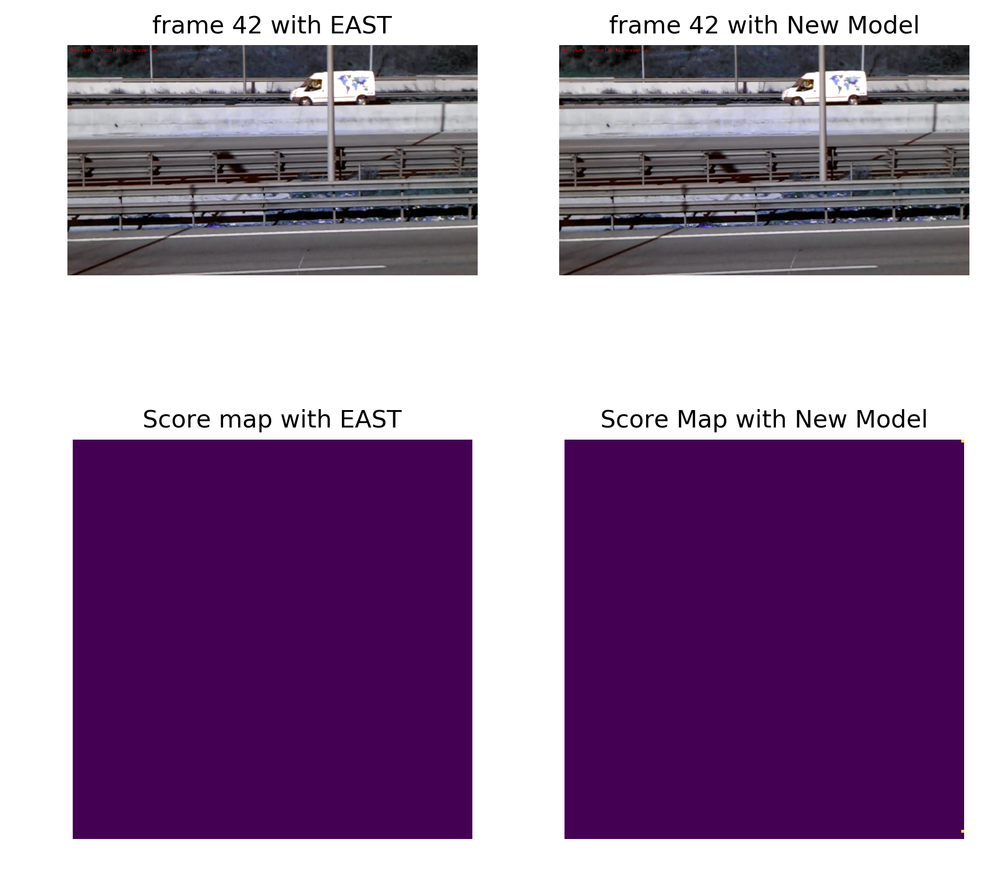

New Model:results on frame 43 is P:0, R0, F:0
EAST Model:results on frame 43 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


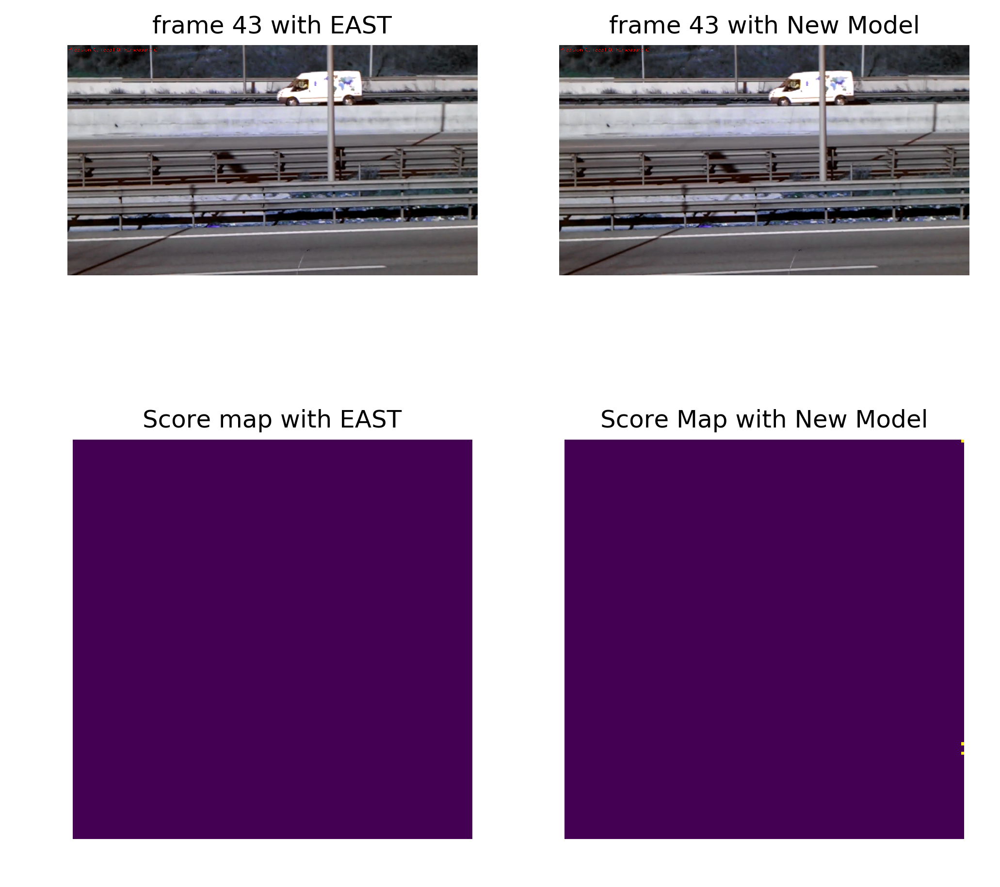

New Model:results on frame 44 is P:0, R0, F:0
EAST Model:results on frame 44 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


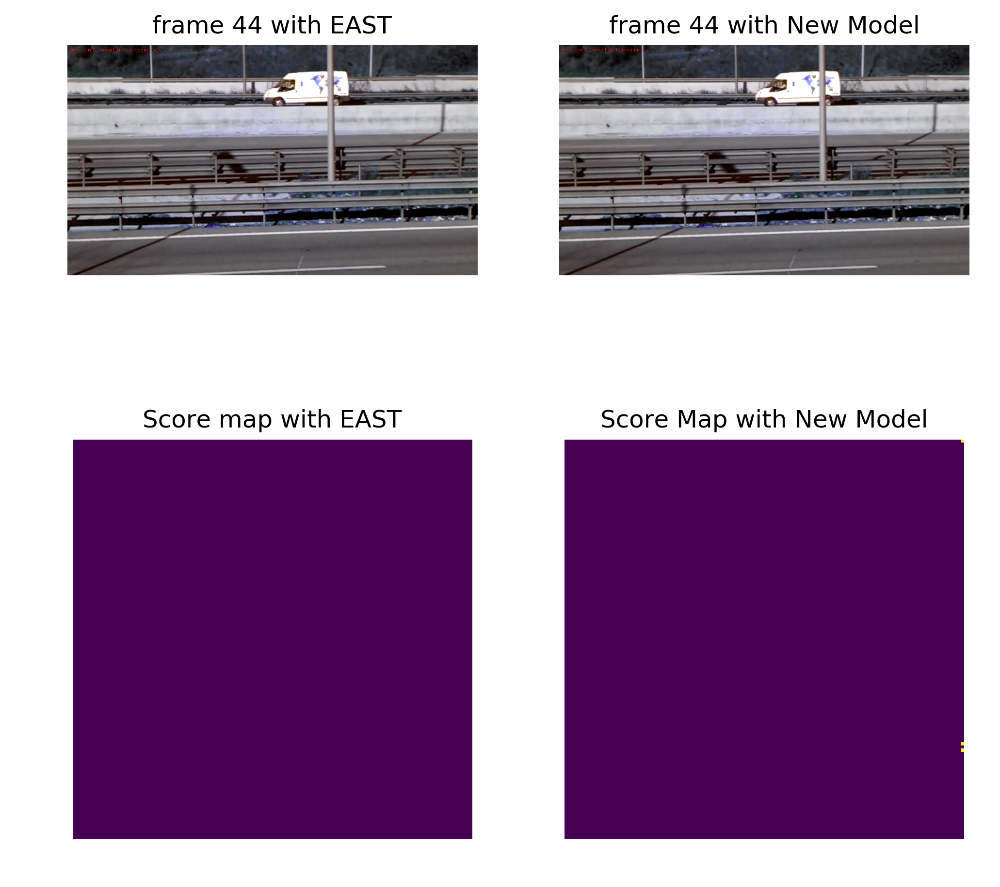

New Model:results on frame 45 is P:0, R0, F:0
EAST Model:results on frame 45 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


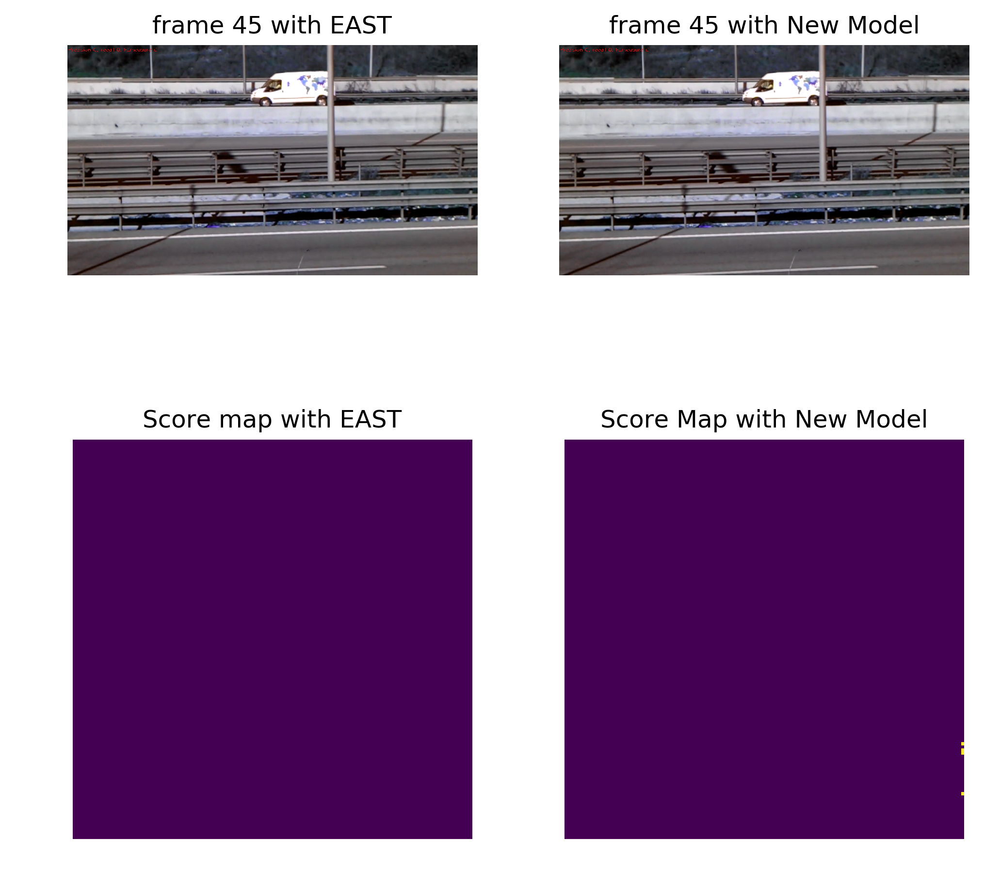

New Model:results on frame 46 is P:0, R0, F:0
EAST Model:results on frame 46 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


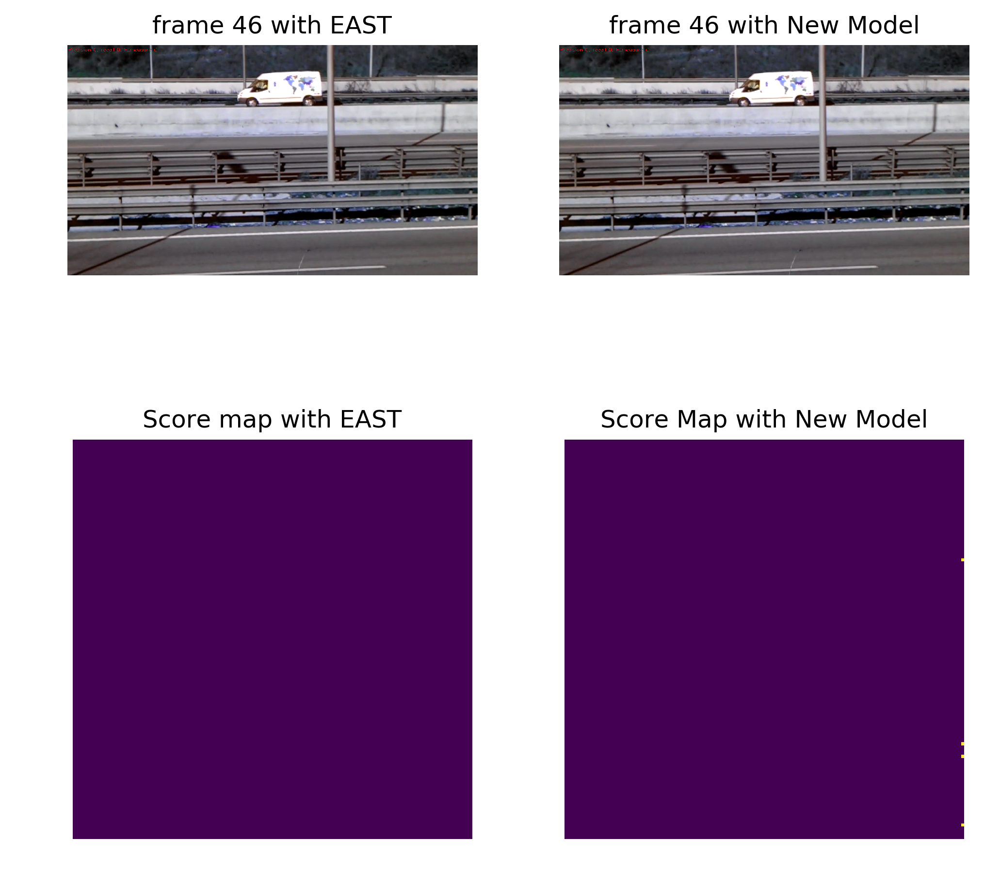

New Model:results on frame 47 is P:0, R0, F:0
EAST Model:results on frame 47 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


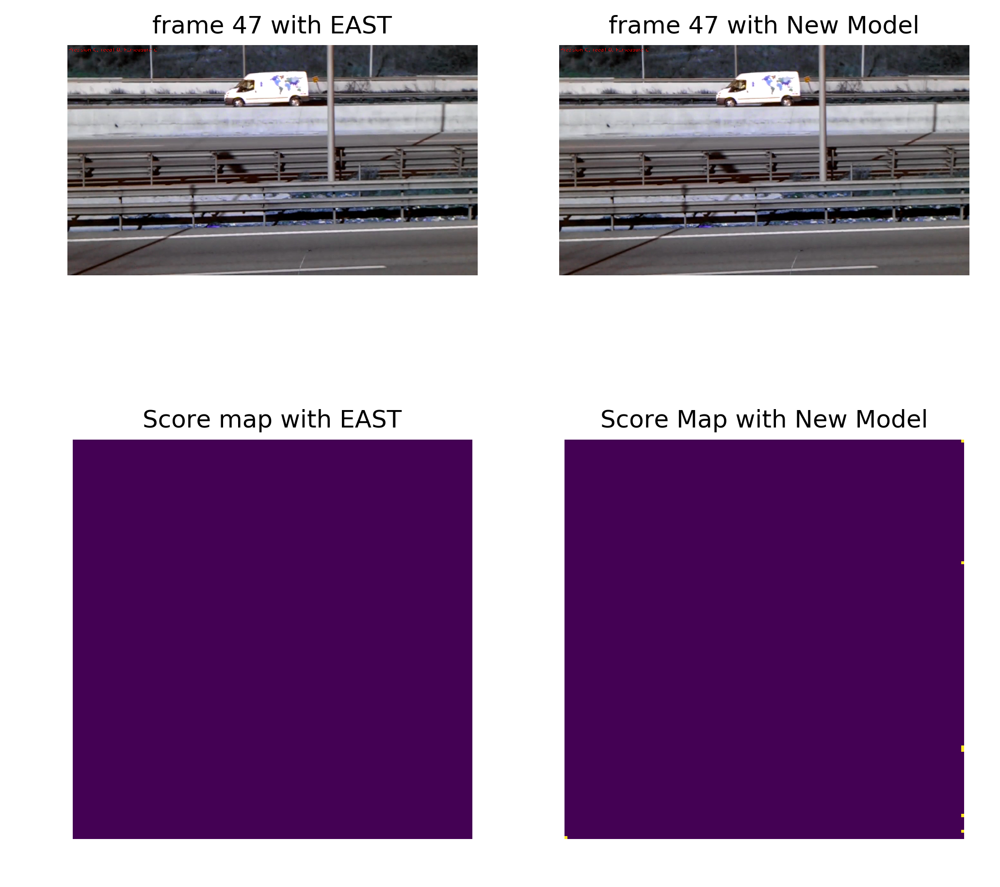

New Model:results on frame 48 is P:0, R0, F:0
EAST Model:results on frame 48 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


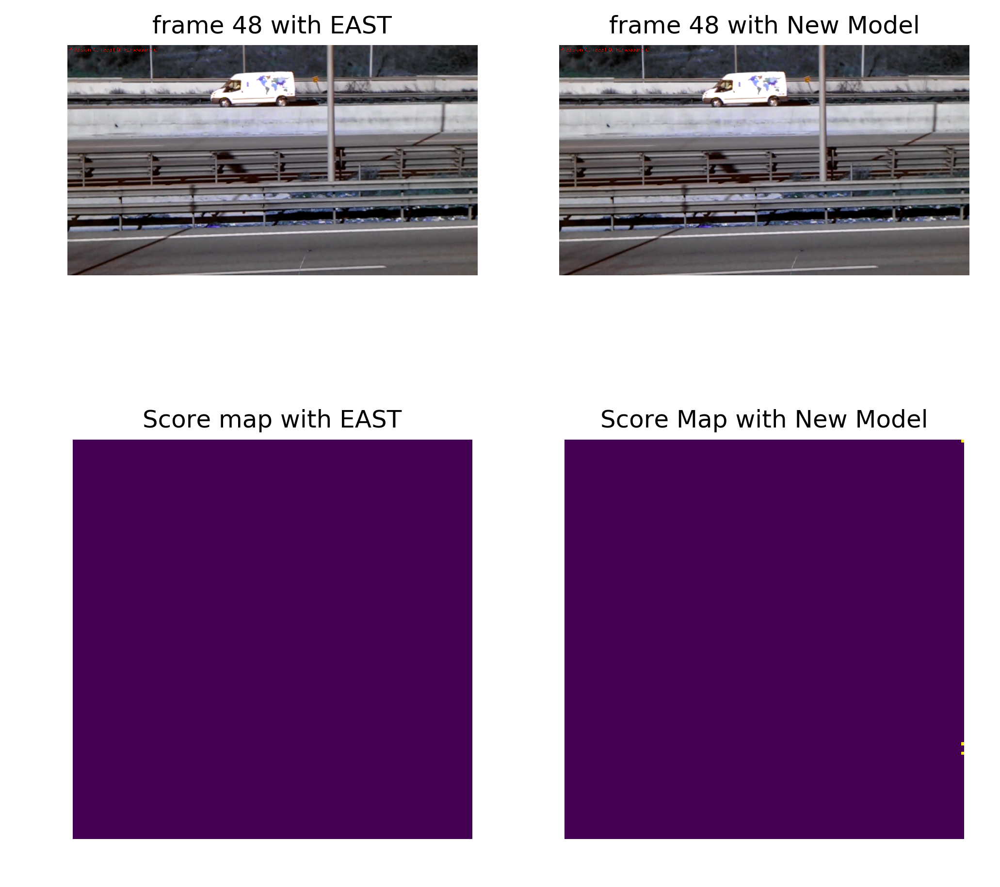

New Model:results on frame 49 is P:0, R0, F:0
EAST Model:results on frame 49 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


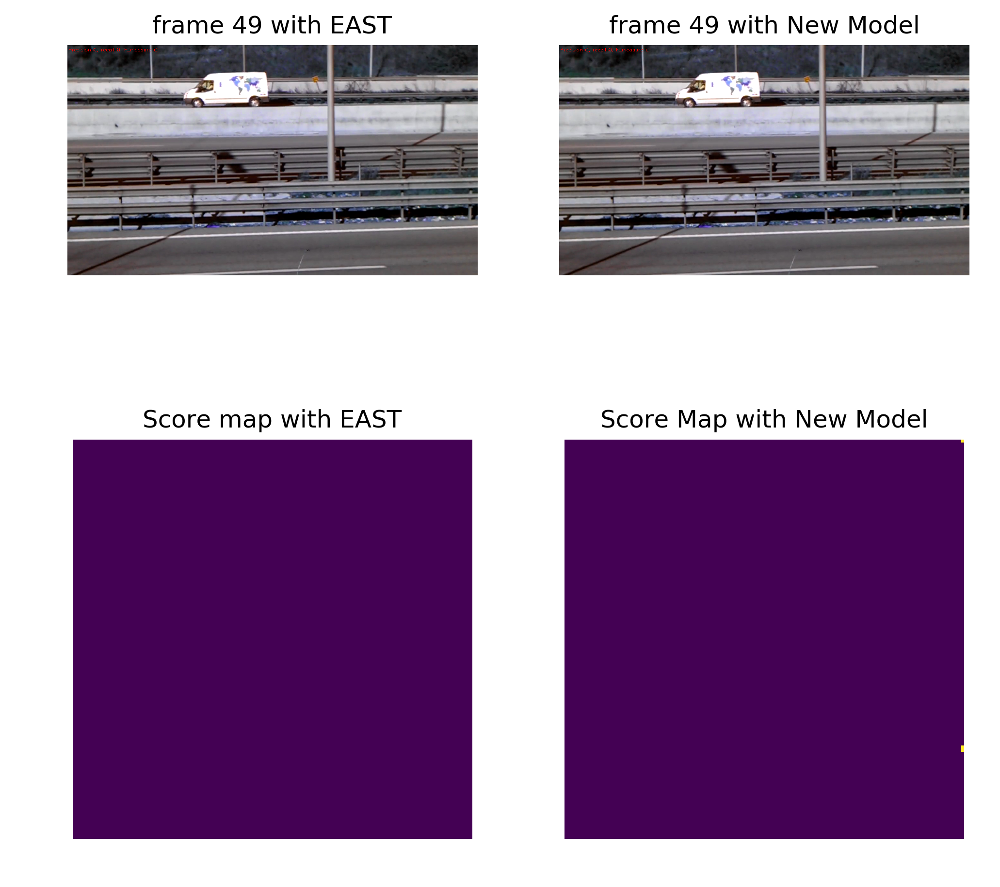

New Model:results on frame 50 is P:0, R0, F:0
EAST Model:results on frame 50 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:
(Pdb) c


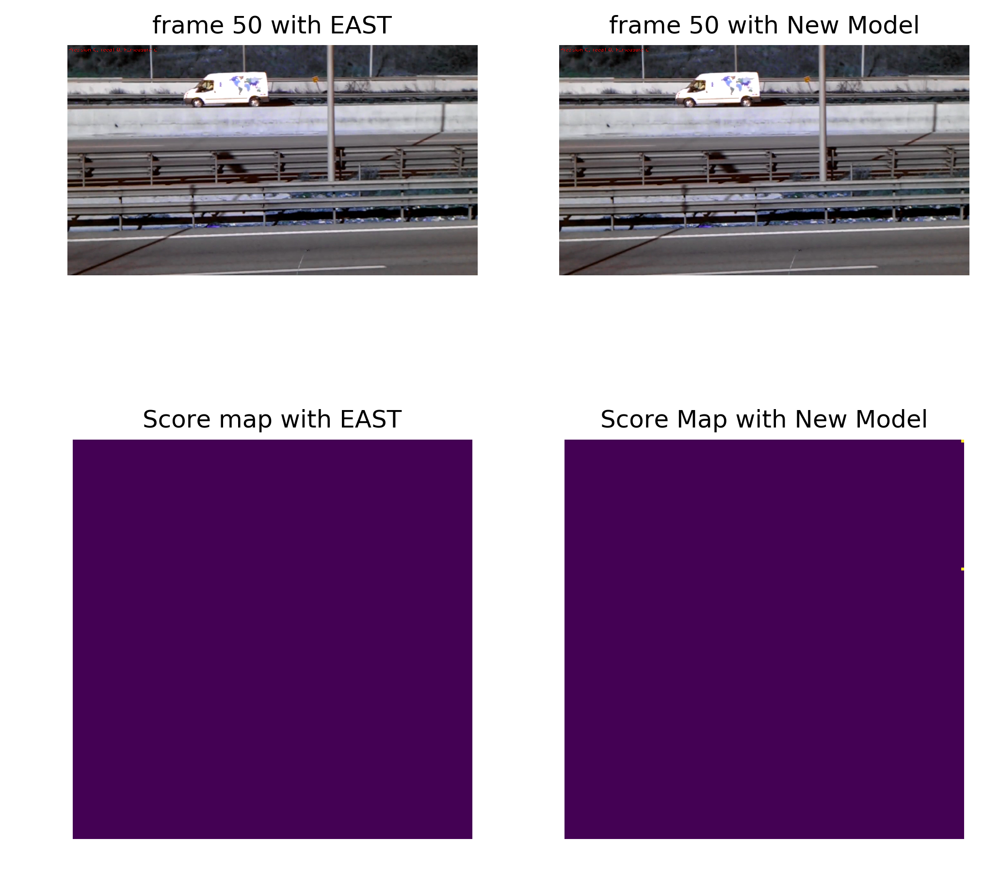

New Model:results on frame 51 is P:0, R0, F:0
EAST Model:results on frame 51 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(200)main()
-> import pdb;pdb.set_trace()
(Pdb) c


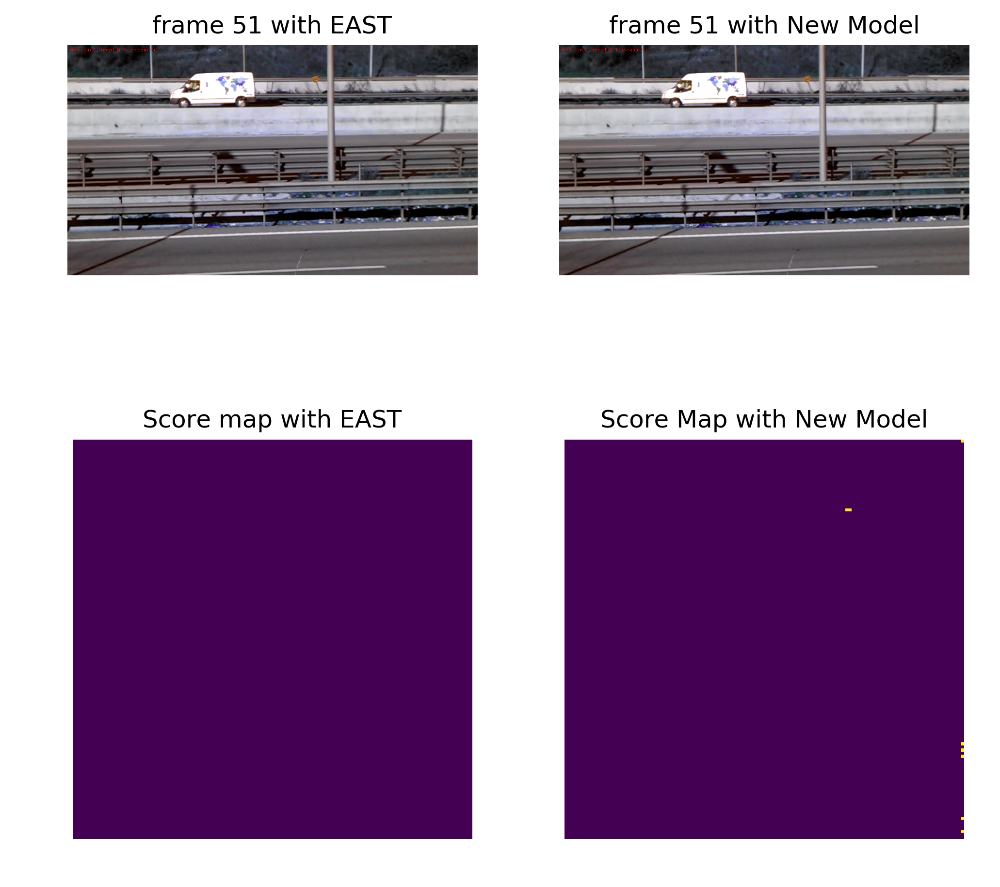

New Model:results on frame 52 is P:0, R0, F:0
EAST Model:results on frame 52 is P:0, R0, F:0
> <ipython-input-5-e505e620f392>(201)main()
-> if FLAGS.vis:


In [ ]:
%matplotlib inline
FLAGS.vis = True
#>>>>>>>>>>>>>>>>>>>>>>>>> specs for AGG >>>>>>>>>>>>>>>>>>>>>>>>>>>#
FLAGS.batch_size_per_gpu = 1
FLAGS.seq_len = 5
FLAGS.gpu_list ='1'
FLAGS.num_gpus  = 1
def main(argv=None):
    config = get_config(FLAGS)
    config.batch_size = FLAGS.batch_size_per_gpu * FLAGS.num_gpus
    config.num_layers = 3
    config.num_steps  = 5
    ######################## Set up model configurations ######################
    #>>>>>>>>>>>>>>>>>>>>>>>>>>>>> EAST model options >>>>>>>>>>>>>>>>>>>>>>>>>>
    checkpoint_path = '/work/cascades/lxiaol9/ARC/EAST/checkpoints/east/'
    idname1 = '20180921-173054'
    idname2 = 'model.ckpt-56092'
    model_path = checkpoint_path + idname1 + '/' + idname2
    #>>>>>>>>>>>>>>>>>>>>>>>>>>>>> PWCnet model options >>>>>>>>>>>>>>>>>>>>>>>>>>
    nn_opts = deepcopy(_DEFAULT_PWCNET_VAL_OPTIONS)
    if FLAGS.flownet_type is 'small':
        pwc_cfg = cfg_sm()
        pwc_cfg.num_steps = FLAGS.seq_len
        nn_opts['use_dense_cx'] = False
        nn_opts['use_res_cx'] = False
        nn_opts['pyr_lvls'] = 6
        nn_opts['flow_pred_lvl'] = 2
    else:
        pwc_cfg = cfg_lg()
        pwc_cfg.num_steps = FLAGS.seq_len
        nn_opts['use_dense_cx'] = True
        nn_opts['use_res_cx'] = True
        nn_opts['pyr_lvls'] = 6
        nn_opts['flow_pred_lvl'] = 2
    nn_opts['verbose'] = True
    nn_opts['ckpt_path'] = pwc_cfg.ckpt_path
    nn_opts['batch_size'] = FLAGS.num_steps - 1      # This is Batch_size per GPU
    nn_opts['use_tf_data'] = False  # Don't use tf.data reader for this simple task
    nn_opts['gpu_devices'] = ['/device:GPU:1']    #
    nn_opts['controller'] = '/device:CPU:0'     # Evaluate on CPU or GPU?
    nn_opts['adapt_info'] = (1, 436, 1024, 2)
    nn_opts['x_shape'] = [2, 512, 512, 3] # image pairs input shape [2, H, W, 3]
    nn_opts['y_shape'] = [512, 512, 2] # u,v flows output shape [H, W, 2]
    ################################ Model Initialization ############################
    # 3. for EAST model 
    tf.reset_default_graph()
    g = tf.Graph()
    with g.as_default():
        gpu_options = tf.GPUOptions(allow_growth=True)
        input_images = tf.placeholder(tf.float32, shape=[None, None, None, 3], name='input_images')
        global_step = tf.get_variable('global_step', [], initializer=tf.constant_initializer(0), trainable=False)
        score_raw, geometry_raw, feature_raw = model.model(input_images, is_training=False)
        variable_averages = tf.train.ExponentialMovingAverage(0.997, global_step)
        saver = tf.train.Saver(variable_averages.variables_to_restore())
        sess = tf.Session(config=tf.ConfigProto(allow_soft_placement=True))
        logger.info('Restore from {}'.format(model_path))
        saver.restore(sess, model_path)
        # Build the graph
    tf.reset_default_graph()
    g1 = tf.Graph()
    with g1.as_default():
        batch_size = FLAGS.batch_size_per_gpu * FLAGS.num_gpus
        len_seq = FLAGS.num_steps
        input_feat_maps = tf.placeholder(tf.float32, shape=[batch_size, len_seq, 128, 128, 32], name='input_feature_maps')
        input_flow_maps = tf.placeholder(tf.float32, shape=[batch_size, len_seq-1, 128, 128, 2], name='input_flow_maps')
        input_score_maps = tf.placeholder(tf.float32, shape=[batch_size , len_seq, 128, 128, 1], name='input_score_maps')
#         if FLAGS.geometry == 'RBOX':
#             input_geo_maps = tf.placeholder(tf.float32, shape=[batch_size, len_seq, 128, 128, 5], name='input_geo_maps')
#         else:
#             input_geo_maps = tf.placeholder(tf.float32, shape=[batch_size, len_seq, 128, 128, 8], name='input_geo_maps')
#         input_training_masks = tf.placeholder(tf.float32, shape=[batch_size, len_seq, 128, 128, 1], name='input_training_masks'
        reuse_variables = None
        global_step = tf.get_variable('global_step', [], initializer=tf.constant_initializer(0), trainable=False)
        score_map_set, geo_map_set = model_gru_agg.build_model(input_feat_maps, input_flow_maps, config=config, reuse_variables=reuse_variables)
        config1 = tf.ConfigProto()
        config1.gpu_options.allow_growth = True
        config1.allow_soft_placement = True
        sess1 = tf.Session(config=config1)
        # 
        saver1 = tf.train.Saver(tf.global_variables())
        print('continue training from previous checkpoint')
        ckpt = FLAGS.prev_checkpoint_path
        saver1.restore(sess1, ckpt)
    # 2. for PWCnet model 
    nn = ModelPWCNet(mode='test', options=nn_opts)
    start = time.time()
    #>>>>>>>>>>>>>>>>>>>>>>Start evaluation>>>>>>>>>>>>>>>>>>>>>>>>>#
    P_test = []
    R_test = []
    f1_test= []
    index = range(8, 9)
    file_txt = save_path + 'eval_gruagg_20181202.txt'
    file1 = open(file_txt,"w+")
    file1.close()
    for k in index:
        P_video = []
        R_video = []
        f1_video = []
        new_detections = []
        video_save = save_path + video_set[k] + idname1 + '_' + idname2 + '.avi'
        t_start = time.time()
        # sort up all the paths
        xml_solo_path = test_data_path + video_set[k]
        raw_video_path = test_data_path + video_set[k]+'.mp4'
        cap = cv2.VideoCapture(raw_video_path)
        frame_width = int(cap.get(3))
        frame_height= int(cap.get(4))
        cnt_frame = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        print('Now testing '+video_set[k] + ' with %d frames'%(cnt_frame))
        out = cv2.VideoWriter(video_save, cv2.VideoWriter_fourcc('M','J','P','G'), 10, (frame_width,frame_height))
        
        # 1. load both polys and tags; 2. generate geo maps(the format of polys and tags need to match)
        polys_array_list, tags_array_list, id_list_list, frame_num = load_annotations_solo(xml_solo_path, \
                    1, cnt_frame, frame_width, frame_height)
        #>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>loop over frames in the time steps, one by one>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
        data_original = np.zeros((FLAGS.batch_size_per_gpu, FLAGS.num_steps, frame_height, frame_width, 3))
        data_seq = np.zeros((FLAGS.batch_size_per_gpu, FLAGS.num_steps, 512, 512, 3))
        for m in range(FLAGS.num_steps):
            cap.set(1, m)
            ret, frame = cap.read()
            im_resized = cv2.resize(frame, (int(512), int(512)))
            data_original[0, m, :, :,:] = frame
            data_seq[0, m, :, : , :] = im_resized
        half_size = int((FLAGS.num_steps- 1)/2)
#         for i in range(half_size, cnt_frame-half_size):
        for i in range(20, 60):
            start = time.time()
            cap.set(1, half_size + i)
            ret, frame = cap.read()
            im_resized = cv2.resize(frame, (int(512), int(512)))
            if i>half_size:
                data_original[0,0:(FLAGS.seq_len-1), :, :, :] = data_original[0, 1:FLAGS.seq_len, :, :, :]
                data_seq[0,0:(FLAGS.seq_len-1), :, :, :] = data_seq[0, 1:FLAGS.seq_len, :, :, :]
                data_original[0,FLAGS.seq_len-1, :, :, :] = frame
                data_seq[0, FLAGS.seq_len-1, :, :, :] = im_resized
            # feed data for east net
            east_feed = np.reshape(data_seq, [-1, 512, 512, 3])
            ratio_h, ratio_w = 512/frame_height, 512/frame_width
            # feed data for flow net 
            target_frame = np.reshape(np.array(data_seq)[:, 0:4, :, : , :], [-1, 512, 512, 3])
            source_frame = np.reshape(np.array(data_seq)[:, 1:5, :, : , :], [-1, 512, 512, 3])
            flow_feed = np.concatenate((source_frame[:, np.newaxis, :, :, :], target_frame[:, np.newaxis, :, :, :]), axis = 1)
            # >>>>>>>>>>>>>>>>>>>>>>>>>>> feature extraction with EAST >>>>>>>>>>>>>>>>>>>>>>>> #
            mini_batch = 5
            rounds = int(east_feed.shape[0]/mini_batch)
            feature_stack = []
            flow_maps_stack = []
            score_stack = []
            geo_stack = []
            with g.as_default():
                for r in range(rounds):
                    score_map_east, geo_map_east, feature = sess.run([score_raw, geometry_raw, feature_raw],feed_dict={input_images: east_feed[r*mini_batch:(r+1)*mini_batch, :, :, ::-1]})
                    feature_stack.append(feature)
                    score_stack.append(score_map_east)
                    geo_stack.append(geo_map_east)
            feature_maps = np.concatenate(feature_stack, axis=0)
            feature_maps_reshape = np.reshape(feature_maps, [-1, config.num_steps, 128, 128, 32])
#             feature_maps[2, :, :, :] = prev_feature 
            # score, geo for original east 
            score_maps = np.concatenate(score_stack, axis=0)
            geo_maps = np.concatenate(geo_stack, axis=0)
            # >>>>>>>>>>>>>>>>>>>>>>>>>>> flow estimation with PWCnet >>>>>>>>>>>>>>>>>>>>>>>>> #
            x_adapt, x_adapt_info = nn.adapt_x(flow_feed)
            if x_adapt_info is not None:
                y_adapt_info = (x_adapt_info[0], x_adapt_info[2], x_adapt_info[3], 2)
            else:
                y_adapt_info = None
            # Run the adapted samples through the network
            mini_batch = nn_opts['batch_size']*nn.num_gpus
            rounds = int(flow_feed.shape[0]/mini_batch)
            for r in range(rounds):
                feed_dict = {nn.x_tnsr: x_adapt[r*mini_batch:(r+1)*mini_batch, :, :, :, :]}
                y_hat = nn.sess.run(nn.y_hat_test_tnsr, feed_dict=feed_dict)
                y_hats, _ = nn.postproc_y_hat_test(y_hat, y_adapt_info)# suppose to be [batch, height, width, 2]
                flow_maps_stack.append(y_hats[:, 1::4, 1::4, :]/4)
            flow_maps = np.concatenate(flow_maps_stack, axis=0)
            flow_maps = np.reshape(flow_maps, [-1, FLAGS.num_steps-1, 128, 128, 2])
            # display_img_pairs_w_flows(img_pairs, pred_labels)
            #>>>>>>>>>>>>>>>>>>>>>>>> Generate results with gru-agg model >>>>>>>>>>>>>>>>>>>>
            with g1.as_default():
                geo_results, sco_results = sess1.run([geo_map_set, score_map_set], feed_dict={input_feat_maps:feature_maps_reshape,
                                                                  input_flow_maps:flow_maps})
            #>>>>>>>>>>>>>>>>>>>>>>>>Okay!!!We could evalute the results now>>>>>>>>>>>>>>>>>>>
            #Results refinement via NMS
            for t in range(FLAGS.num_steps-1, FLAGS.num_steps):
                img = data_original[0, t, :, :,:]
                f_score = sco_results[t][np.newaxis, :, :, :]
                f_geometry = geo_results[t][np.newaxis, :, :, :]
#                 import pdb;pdb.set_trace()
                precision, recall, f1, new_img1 = box_generation(i+half_size, img, frame_height, frame_width, f_score, f_geometry, polys_array_list, tags_array_list, start)
                print("New Model:results on frame {} is P:{}, R{}, F:{}".format(i, precision, recall, f1))
                new_detections.append(new_img1)
                P_video.append(precision)
                R_video.append(recall)
                f1_video.append(f1)
                precision_e, recall_e, f1_e, new_img1_e = box_generation(i+half_size, img, frame_height, frame_width, score_maps[t][np.newaxis, :, :, :], geo_maps[t][np.newaxis, :, :, :], polys_array_list, tags_array_list, start)
                print("EAST Model:results on frame {} is P:{}, R{}, F:{}".format(i, precision_e, recall_e, f1_e))
                vis_save_path = save_path + video_set[k] + '/'
                if not os.path.exists(vis_save_path):
                    os.makedirs(vis_save_path) 
                import pdb;pdb.set_trace()
                if FLAGS.vis:
    #                 fig = plt.figure(figsize=(15, 6), dpi=300)
    #                 for t in range(FLAGS.seq_len):
    #                     ax1 = fig.add_subplot(2, FLAGS.seq_len, t+1, aspect='equal')
    #                     ax1.set_title('frame{}'.format(i-mf_ind+t))
    #                     plt.axis('off')
    #                     ax1.imshow(data_original[0, t, :, :,:].astype(np.uint8))
    #                     ax2 = fig.add_subplot(2, FLAGS.seq_len, FLAGS.seq_len+t+1, aspect='equal')
    #                     ax2.set_title('score-map{}'.format(i-mf_ind+t))
    #                     plt.axis('off')
    #                     ax2.imshow((np.squeeze(score_maps[t]*255)).astype(np.uint8)) 
    #                 fig.savefig(vis_save_path+"east_frame" + str(i) + ".png", dpi=500)
                    fig1 = plt.figure(figsize=(8, 8), dpi=300)
                    fig1.add_subplot(2, 2, 1, aspect='equal')
                    plt.imshow(new_img1_e.astype(np.uint8))
                    plt.title('frame {} with EAST'.format(i))
                    plt.axis('off')
                    fig1.add_subplot(2, 2, 2, aspect='equal')
                    plt.imshow(new_img1.astype(np.uint8))
                    plt.title('frame {} with New Model'.format(i))
                    plt.axis('off')
                    fig1.add_subplot(2, 2, 3, aspect='equal')
                    plt.imshow((np.squeeze(score_maps[half_size]*255)).astype(np.uint8))
                    plt.title('Score map with EAST')
                    plt.axis('off')
                    fig1.add_subplot(2, 2, 4, aspect='equal')
                    plt.imshow((np.squeeze(f_score*255)).astype(np.uint8))
                    plt.title('Score Map with New Model')
                    plt.axis('off')
                    plt.show()
                    fig1.savefig(vis_save_path+"fuse_frame" + str(i) + ".png", dpi=500)
            # evaluation on ret and gt
            P_test.append(np.array(P_video, dtype=np.float32))
            R_test.append(np.array(R_video, dtype=np.float32))
            f1_test.append(np.array(f1_video, dtype=np.float32))
        print(np.mean(P_video))
        print(np.mean(R_video))
        print(np.mean(f1_video))
#         import pdb;pdb.set_trace()
        with open(file_txt, "a+") as f:
            f.write(video_set[k]+' PRECISION: '+' '.join(["{:0.6f}".format(x) for x in P_video])+'\n')
            f.write(video_set[k]+' RECALL: '+' '.join(["{:0.6f}".format(x) for x in R_video])+'\n')
            f.write(video_set[k]+' F1 SCORE: '+' '.join(["{:0.6f}".format(x) for x in f1_video])+'\n')
        cap.release()
    print('here is the precision')
    for item in P_test:
        print(np.mean(item))
    print('here is the recall')
    for item in R_test:
        print(np.mean(item))
    print('here is the f-score')
    for item in f1_test:
        print(np.mean(item))
    print(video_set)
    
if __name__ == '__main__':
    tf.app.run()

In [ ]:
c
